# OneK1K aging signature analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np
import anndata
import pandas as pd
import mudata as md
import scanpy as sc
import glob
from tqdm import tqdm
import scipy
import pertpy
import yaml

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from copy import deepcopy

import process as process
import plot as plot
# from DE_analysis_utils import *


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/ipykernel/kernelapp.py", lin

AttributeError: _ARRAY_API not found


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/ipykernel/kernelapp.py", lin

AttributeError: _ARRAY_API not found

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/

In [3]:
with open('../../metadata/figure_palettes.yaml', 'r') as f:
    palettes = yaml.safe_load(f)

In [4]:
datadir = '/mnt/oak/users/emma/data/GWT/OneK1K_analysis/'
figdir = 'figures/'
resultsdir = 'results/'
h5ad_file = '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'


### Preprocess data by celltype

In [ ]:

ct_classes = {
    "CD4T":['central memory CD4-positive, alpha-beta T cell', 'naive thymus-derived CD4-positive, alpha-beta T cell', 'effector memory CD4-positive, alpha-beta T cell'],
    "CD8T":['effector memory CD8-positive, alpha-beta T cell', 'naive thymus-derived CD8-positive, alpha-beta T cell', 'central memory CD8-positive, alpha-beta T cell'],
    "B":['naive B cell', 'memory B cell'],
    'NK':['natural killer cell','CD16-negative, CD56-bright natural killer cell, human']
}

for ct in ct_classes.keys():
    keep_cell_types = ct_classes[ct]
    output_file = datadir + f"Yazar2022_{ct}_processed.h5ad"
    print(output_file)
    adata_1k1k = anndata.experimental.read_lazy(h5ad_file)
    adata = anndata.AnnData(
                obs=adata_1k1k.obs.to_dataframe(),
                var=adata_1k1k.var.to_dataframe(),
                X = adata_1k1k.X
            )
    adata = adata[adata.obs['cell_type'].isin(keep_cell_types)].to_memory()

    # Normalize
    scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
    adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

    # QC
    gene_name_col = 'feature_name'
    counts_col = 'nCount_RNA'
    adata.var["mt"] = adata.var[gene_name_col].str.startswith("MT-")
    adata.var["ribo"] = adata.var[gene_name_col].str.startswith(("RPS", "RPL"))
    adata.var["hb"] = adata.var[gene_name_col].str.contains("^HB[^(P)]")
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)
    adata = process.filter_outliers(adata)

    sc.pp.highly_variable_genes(adata, layer="log1p_norm", n_top_genes=10000)
    adata.write(output_file, compression="gzip")

In [14]:
# lymph_count_lof = pd.read_table('/mnt/oak/users/mineto/workstation/250717_TcellPerturb/input/burden/Backman_LymphocyteCount_fullFeatures.per_gene_estimates.tsv', index_col=0)
# # Find genes present in both datasets
# common_regs = lymph_count_lof.index.intersection(adata_de_obs['target_contrast'].unique())
# # Get target names for common regulators
# target_names_map = adata_de_obs.loc[adata_de_obs['target_contrast'].isin(common_regs), ['target_contrast', 'target_contrast_gene_name']].drop_duplicates().set_index('target_contrast')['target_contrast_gene_name']

# # Add target name column to lymph_count_lof for common regulators
# lymph_count_lof_subset = lymph_count_lof.loc[common_regs].copy()
# lymph_count_lof_subset['target_name'] = target_names_map
# # Sort by post_mean and get ranks
# ranked_data = lymph_count_lof_subset.sort_values('post_mean').reset_index()
# ranked_data['rank'] = range(len(ranked_data))

# # Plot post_mean vs rank
# plt.figure(figsize=(10,6))
# plt.scatter(ranked_data['rank'], ranked_data['post_mean'], alpha=0.5, s=20)

# # Annotate top 5 and bottom 5
# from adjustText import adjust_text

# texts = []
# for i in range(10):
#     # Bottom 5
#     texts.append(plt.text(ranked_data['rank'].iloc[i], 
#                          ranked_data['post_mean'].iloc[i],
#                          ranked_data['target_name'].iloc[i]))
    
#     # Top 5
#     texts.append(plt.text(ranked_data['rank'].iloc[-(i+1)], 
#                          ranked_data['post_mean'].iloc[-(i+1)],
#                          ranked_data['target_name'].iloc[-(i+1)]))

# adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5))

# plt.xlabel('Rank')
# plt.ylabel('Post Mean')
# plt.title('Gene Effect Size Rankings')
# plt.show()

### Read outputs from DE analysis

Run with `1k1k_analysis.py`

In [5]:
# get features used on perturb-seq dataset
adata_de_var = sc.read_h5ad(f'/mnt/oak/users/emma/data/GWT/CD4i_final//DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad').var
adata_de_obs = sc.read_h5ad(f'/mnt/oak/users/emma/data/GWT/CD4i_final//DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad').obs

NaNs encountered, dropping rows with NaNs


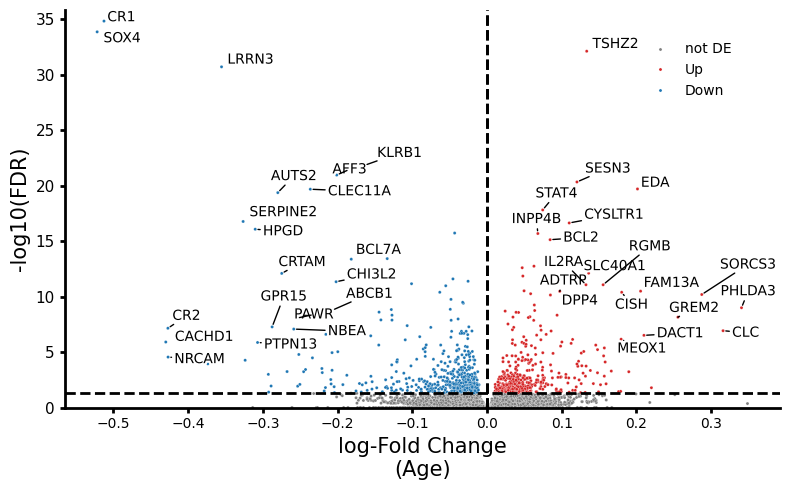

<Figure size 800x2000 with 0 Axes>

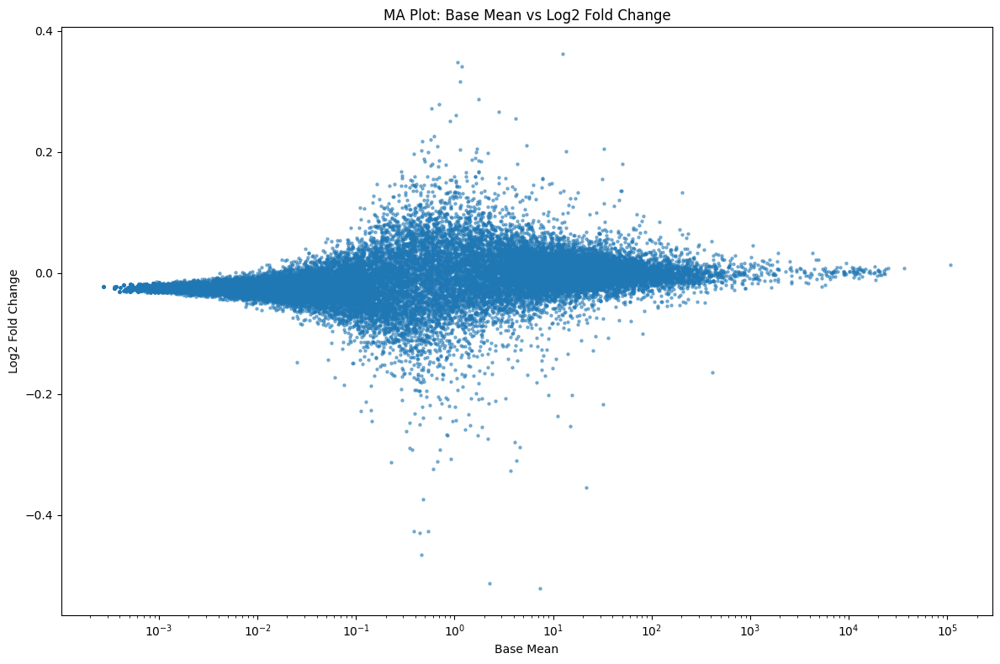

In [214]:
ct = 'CD4T'
pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
pbulk_adata.var_names.isin(adata_de_var.index).sum()

res_df = pd.read_csv(f'results/DE_age_cat_{ct}_train.csv', index_col=0)
res_df = res_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
if 'variable' not in res_df.columns:
    res_df['variable'] = res_df.index.values
res_df['gene_name'] = pbulk_adata.var.loc[res_df.variable]['feature_name'].values
res_df['perturbseq_gene'] = res_df['variable'].isin(adata_de_var.index)
res_df['contrast'] = 'age'
res_df['zscore'] = res_df['log_fc']/res_df['lfcSE']
res_df['adj_p_value'] = res_df['adj_p_value'].fillna(1)

onek1k_design = f"~ male + age_cat"
model = pertpy.tl.PyDESeq2(pbulk_adata, design=onek1k_design)

fig = model.plot_volcano(
    res_df[res_df['perturbseq_gene']], 
    log2fc_thresh=0, 
    return_fig=True, 
    to_label = 20,
    symbol_col='gene_name',
    figsize=(8, 5),  # Increased figure size
    s=5,
    legend_pos = (0.95,0.95),
    y_label = '-log10(FDR)', x_label='log-Fold Change\n(Age)'
    )
fig.tight_layout()  
fig.show()  

plt.figure(figsize=(8,20))
fig = plt.figure(figsize=(12, 8))
plt.scatter(res_df['baseMean'], res_df['log_fc'], alpha=0.5, s=5)
plt.xscale('log')
plt.xlabel('Base Mean')
plt.ylabel('Log2 Fold Change') 
plt.title('MA Plot: Base Mean vs Log2 Fold Change')
fig.tight_layout()
plt.show()

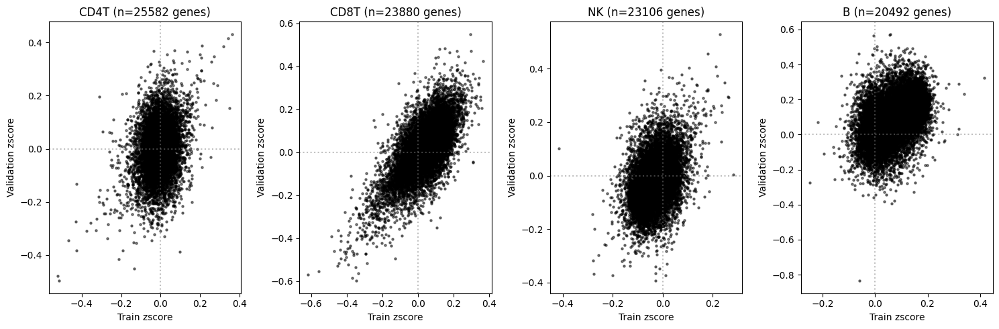

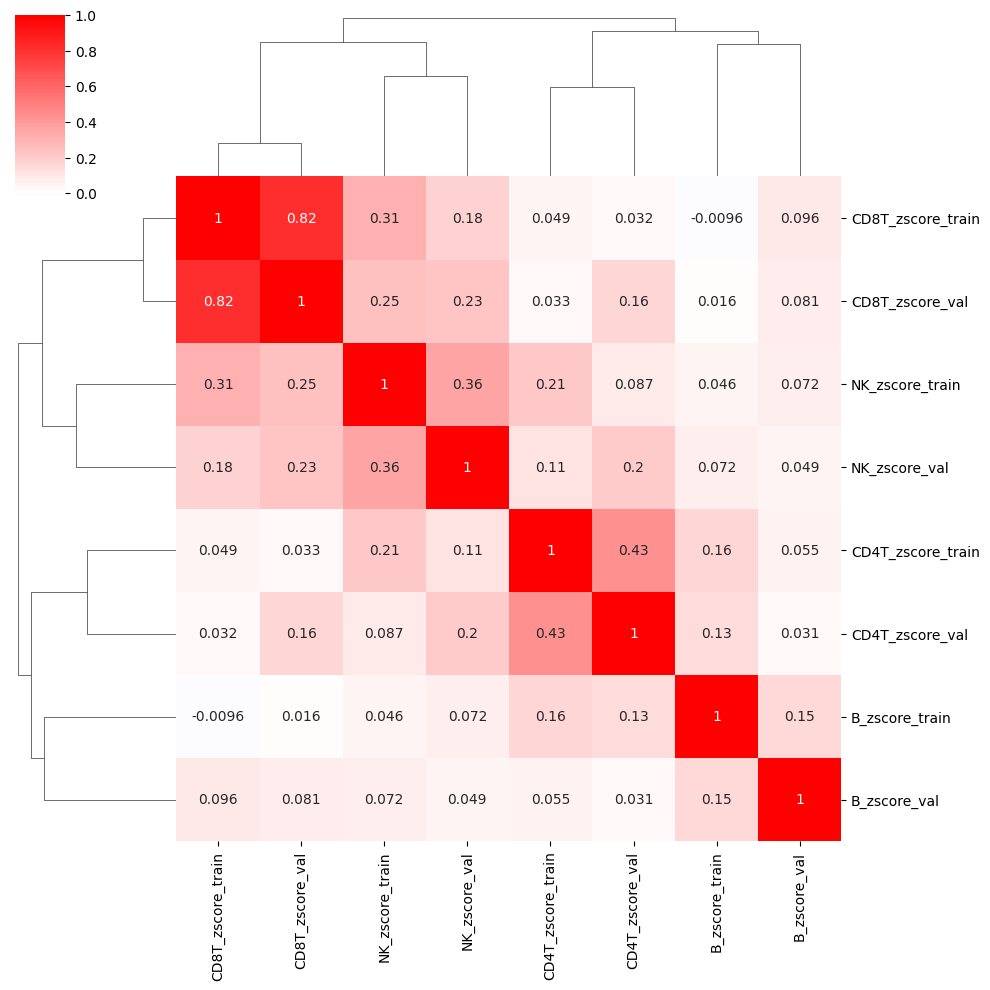

In [228]:
def get_reliability(x, sigma):
    sigma2_obs = np.var(x, ddof=1)  # Observed variance across features
    sigma2_sem = np.mean(sigma**2)   # Average squared standard error
    sigma2_true = sigma2_obs - sigma2_sem  # Estimated true signal variance
    reliability = sigma2_true / (sigma2_true + sigma2_sem)
    return(reliability)

def get_max_correlation(x_a, sigma_a, x_b, sigma_b):
    """Calculate maximum possible correlation"""
    rel_a = get_reliability(x_a, sigma_a)
    rel_b = get_reliability(x_b, sigma_b)
    return np.sqrt(rel_a * rel_b)

def get_lfc_correlation(x_a, sigma_a, x_b, sigma_b):
    """Calculate maximum possible correlation"""
    corr = x_a.corr(x_b)
    corr_ceil = get_max_correlation(x_a, sigma_a, x_b, sigma_b)
    return corr, corr_ceil

# Define cell type classes
ct_classes = ['CD4T', 'CD8T', 'NK', 'B']

# Read pbulk data
pbulk_adata = sc.read_h5ad('pbulked.h5ad')

# Dictionary to store results for each cell type
train_results = {}
val_results = {}

# Load results for each cell type
for ct in ct_classes:
    pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
    pbulk_adata.var_names.isin(adata_de_var.index).sum()
    # Read and process training data
    train_df = pd.read_csv(f'results/DE_age_cat_{ct}_train.csv', index_col=0)
    train_df = train_df[(train_df['baseMean'] > 0)]
    train_df = train_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in train_df.columns:
        train_df['variable'] = train_df.index.values
    train_df['gene_name'] = pbulk_adata.var.loc[train_df.variable]['feature_name'].values
    train_df['perturbseq_gene'] = train_df['variable'].isin(adata_de_var.index)
    train_df['zscore'] = train_df['log_fc']/train_df['lfcSE']
    train_df['adj_p_value'] = train_df['adj_p_value'].fillna(1)
    train_results[ct] = train_df

    # Read and process validation data
    val_df = pd.read_csv(f'results/DE_age_cat_{ct}_validation.csv', index_col=0)
    val_df = val_df[(val_df['baseMean'] > 0)]
    val_df = val_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in val_df.columns:
        val_df['variable'] = val_df.index.values
    val_df['gene_name'] = pbulk_adata.var.loc[val_df.variable]['feature_name'].values
    val_df['perturbseq_gene'] = val_df['variable'].isin(adata_de_var.index)
    val_df['zscore'] = val_df['log_fc']/val_df['lfcSE']
    val_df['adj_p_value'] = val_df['adj_p_value'].fillna(1)
    val_results[ct] = val_df

# Plot train vs validation zscores for common genes
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
for i, ct in enumerate(ct_classes):
    # Get genes present in both train and validation sets
    common_genes = set(train_results[ct]['variable']) & set(val_results[ct]['variable'])
    
    # Filter for common genes
    train_data = train_results[ct][train_results[ct]['variable'].isin(common_genes)]
    val_data = val_results[ct][val_results[ct]['variable'].isin(common_genes)]
    
    train_zscore = train_data['log_fc']
    val_zscore = val_data['log_fc']
    
    axes[i].scatter(train_zscore, val_zscore, alpha=0.5, s=5, color='black')
    axes[i].axhline(y=0, color='grey', linestyle=':', alpha=0.5)
    axes[i].axvline(x=0, color='grey', linestyle=':', alpha=0.5)
    axes[i].set_xlabel('Train zscore')
    axes[i].set_ylabel('Validation zscore')
    axes[i].set_title(f'{ct} (n={len(common_genes)} genes)')
plt.tight_layout()
plt.show()

# Add gene names and concatenate train/val results for each cell type
ct_train = pd.concat([train_results[ct][['zscore', 'gene_name']].rename(columns={'zscore': f'{ct}_zscore'}).set_index('gene_name') for ct in ct_classes], axis=1)
ct_val = pd.concat([val_results[ct][['zscore', 'gene_name']].rename(columns={'zscore': f'{ct}_zscore'}).set_index('gene_name') for ct in ct_classes], axis=1)

# Concatenate train and val together
ct_combined = pd.concat([
    ct_train.add_suffix('_train'),
    ct_val.add_suffix('_val')
], axis=1)

sns.clustermap(ct_combined.dropna().corr(), cmap='bwr', center=0, annot=True)

Text(0.5, 1.0, 'Effect size comparison between CD8T and CD4T\n(n=26249 genes)')

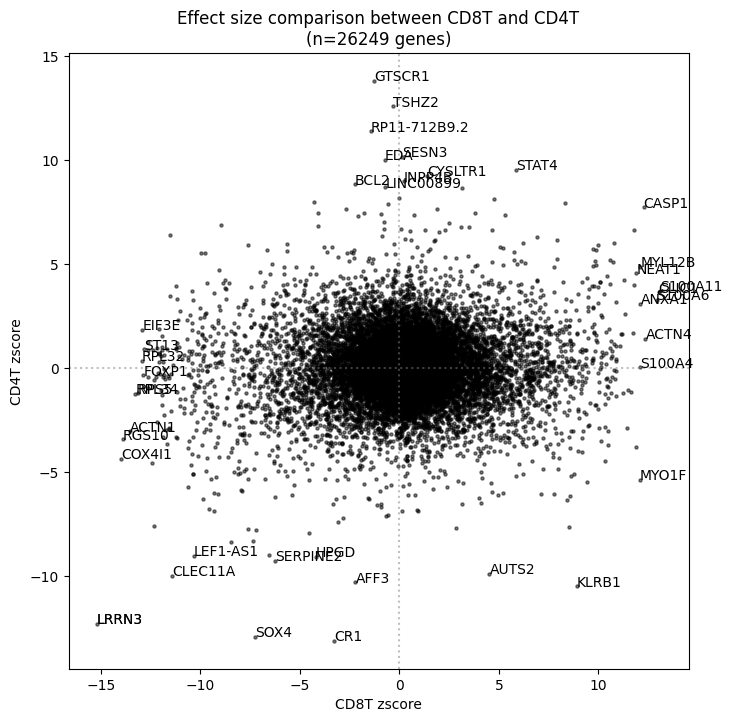

In [259]:
# Get genes present in both CD8T and CD4T results
common_genes = set(train_results['CD8T']['variable']) & set(train_results['CD4T']['variable'])

# Filter for common genes
x_res = train_results['CD8T'][train_results['CD8T']['variable'].isin(common_genes)]
y_res = train_results['CD4T'][train_results['CD4T']['variable'].isin(common_genes)]
assert all(x_res.index == y_res.index)
# Number of top/bottom genes to label
n_genes = 10

# Get top/bottom genes
x_top = x_res.nlargest(n_genes, 'zscore')
x_bottom = x_res.nsmallest(n_genes, 'zscore')
y_top = y_res.nlargest(n_genes, 'zscore')
y_bottom = y_res.nsmallest(n_genes, 'zscore')

plt.figure(figsize=(8,8))
plt.scatter(x_res['zscore'], y_res['zscore'], alpha=0.5, s=5, color='black')
plt.axhline(y=0, color='grey', linestyle=':', alpha=0.5)
plt.axvline(x=0, color='grey', linestyle=':', alpha=0.5)

# Add gene labels
for _, row in x_top.iterrows():
    plt.annotate(row['gene_name'], (row['zscore'], y_res.loc[row.name, 'zscore']))
for _, row in x_bottom.iterrows():
    plt.annotate(row['gene_name'], (row['zscore'], y_res.loc[row.name, 'zscore']))
for _, row in y_top.iterrows():
    plt.annotate(row['gene_name'], (x_res.loc[row.name, 'zscore'], row['zscore']))
for _, row in y_bottom.iterrows():
    plt.annotate(row['gene_name'], (x_res.loc[row.name, 'zscore'], row['zscore']))

plt.xlabel('CD8T zscore')
plt.ylabel('CD4T zscore')
plt.title(f'Effect size comparison between CD8T and CD4T\n(n={len(common_genes)} genes)')

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:827: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    ['1_1', '2_2', '3_3', '4_4', '6_6']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "obs")
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['MIR1302-2HG', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


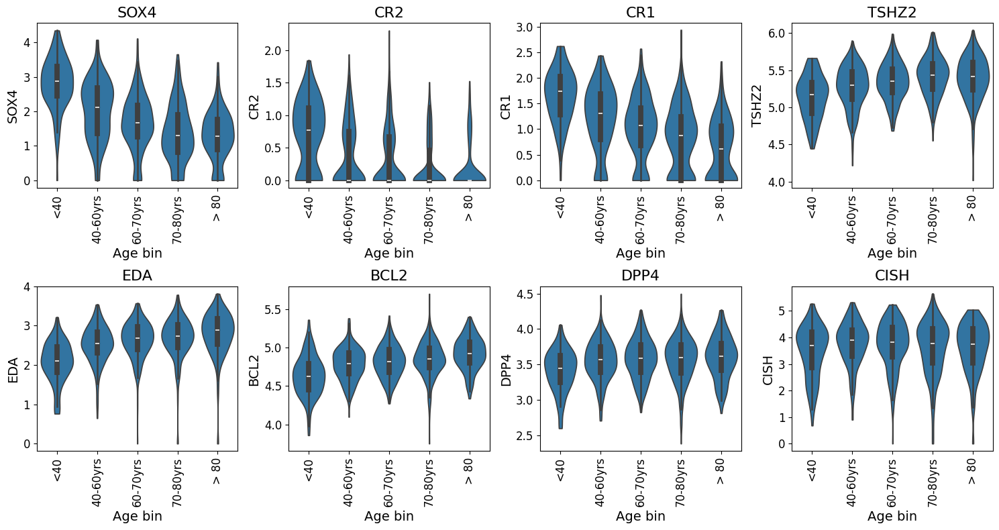

In [338]:
pbulk_adata = sc.read_h5ad(datadir + "Yazar2022_CD4T_processed.pbulk.h5ad")
pbulk_adata.obs_names_make_unique()
pbulk_adata.var['ensembl_id'] = pbulk_adata.var.index
pbulk_adata.var_names = pbulk_adata.var['feature_name']

# Create mapping dictionary for age categories
age_cat_map = {
    1: '<40',
    2: '40-60yrs', 
    3: '60-70yrs',
    4: '70-80yrs',
    5: '> 80'
}

pbulk_adata.obs['age_cat'] = pbulk_adata.obs['age_cat'].map(age_cat_map)

gs = ['SOX4','CR2', 'CR1', 'TSHZ2', 'EDA', 'BCL2', 'DPP4', 'CISH']
fig, axes = plt.subplots(2, 4, figsize=(15, 8))
axes = axes.flatten()
for i, g in enumerate(gs):
    gex_df = sc.get.obs_df(pbulk_adata, [g, 'age_cat'], layer='log1p_norm')
    # Set order of age categories 
    age_order = ['<40', '40-60yrs', '60-70yrs', '70-80yrs', '> 80']
    sns.violinplot(data=gex_df, x='age_cat', y=g, ax=axes[i],
                   order=age_order, cut=0, scale='width')
    axes[i].tick_params(axis='x', rotation=90, labelsize=12)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].set_xlabel('Age bin', fontsize=14)
    axes[i].set_ylabel(g, fontsize=14)
    axes[i].set_title(g, fontsize=16)
plt.tight_layout()

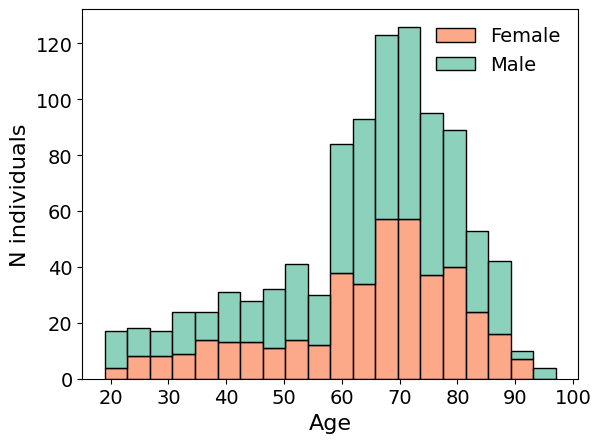

In [163]:
sns.histplot(data=pbulk_adata.obs, x='age', hue='male', multiple='stack', palette='Set2', legend=True)
plt.xlabel('Age', fontsize=16)
plt.ylabel('N individuals', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='', labels=['Female', 'Male'], frameon=False, fontsize=14)

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['MIR1302-2HG', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")
... storing 'age_cat' as categorical


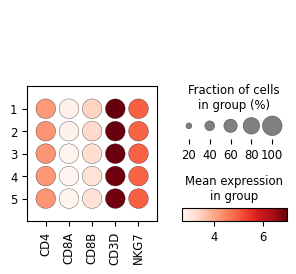

In [252]:
ct = 'CD4T'
pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
pbulk_adata.var_names = pbulk_adata.var['feature_name']
pbulk_adata.obs['age_cat'] = pbulk_adata.obs['age_cat'].astype(str)
sc.pl.dotplot(pbulk_adata, ['CD4', 'CD8A', 'CD8B', 'CD3D', 'NKG7'], groupby='age_cat', layer='log1p_norm')

### Lymphocyte counts analysis

NaNs encountered, dropping rows with NaNs


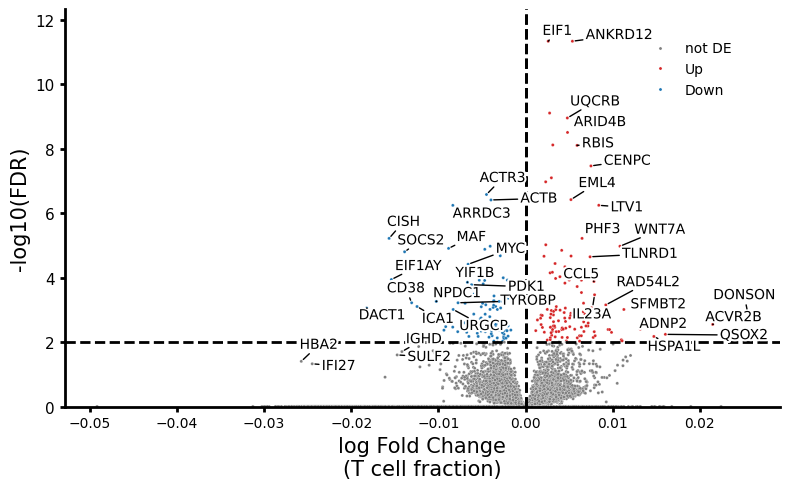

<Figure size 800x2000 with 0 Axes>

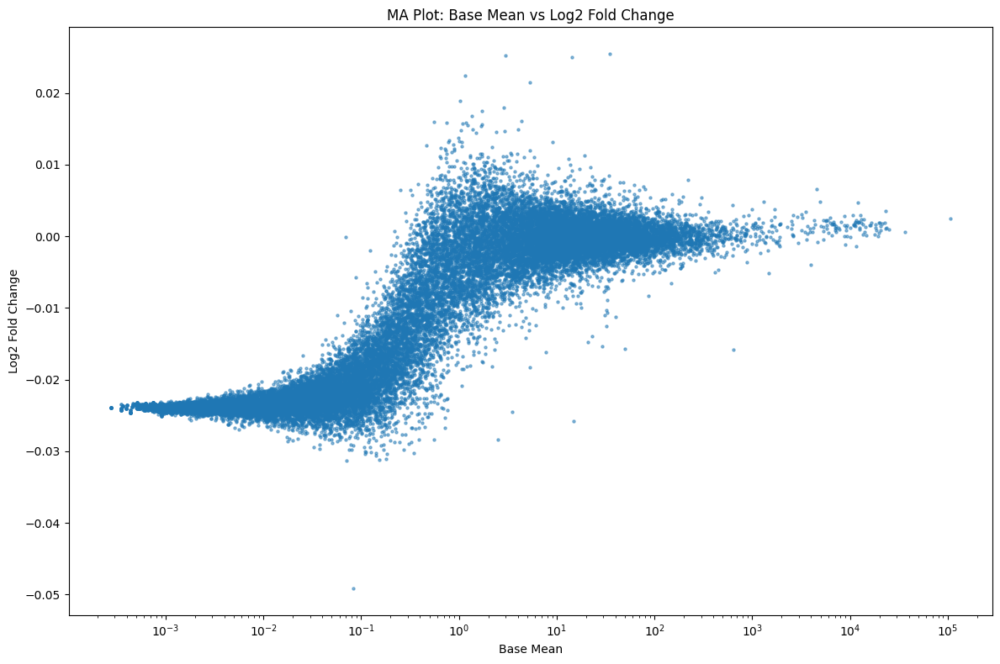

In [135]:
ct = 'CD4T'
pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
pbulk_adata.var_names.isin(adata_de_var.index).sum()

res_df = pd.read_csv(f'results/DE_percent_T_cells_{ct}_train.csv', index_col=0)
res_df = res_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
if 'variable' not in res_df.columns:
    res_df['variable'] = res_df.index.values
res_df['gene_name'] = pbulk_adata.var.loc[res_df.variable]['feature_name'].values
res_df['perturbseq_gene'] = res_df['variable'].isin(adata_de_var.index)
res_df['contrast'] = 'age'
res_df['zscore'] = res_df['log_fc']/res_df['lfcSE']
res_df['adj_p_value'] = res_df['adj_p_value'].fillna(1)

onek1k_design = f"~ male + age_cat"
model = pertpy.tl.PyDESeq2(pbulk_adata, design=onek1k_design)

fig = model.plot_volcano(
    res_df[res_df['perturbseq_gene']], 
    log2fc_thresh=0, 
    return_fig=True, 
    to_label = 20,
    symbol_col='gene_name',
    figsize=(8, 5),  # Increased figure size
    s=5,
    pval_thresh=0.01,
    legend_pos = (0.95,0.95),
    y_label = '-log10(FDR)',
    x_label = 'log Fold Change\n(T cell fraction)'
    )
fig.tight_layout()  
fig.show()  

plt.figure(figsize=(8,20))
fig = plt.figure(figsize=(12, 8))
plt.scatter(res_df['baseMean'], res_df['log_fc'], alpha=0.5, s=5)
plt.xscale('log')
plt.xlabel('Base Mean')
plt.ylabel('Log2 Fold Change') 
plt.title('MA Plot: Base Mean vs Log2 Fold Change')
fig.tight_layout()
plt.show()

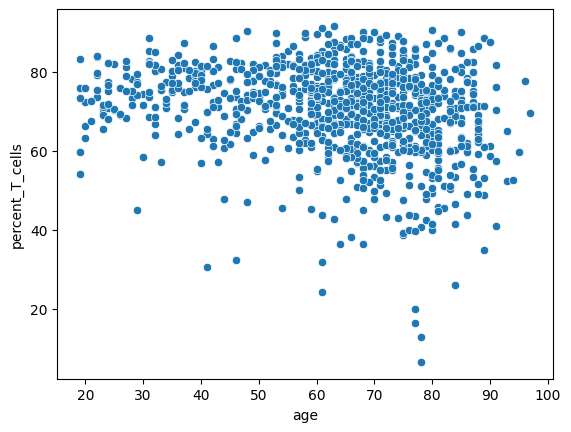

<Axes: xlabel='age_cat', ylabel='percent_T_cells'>

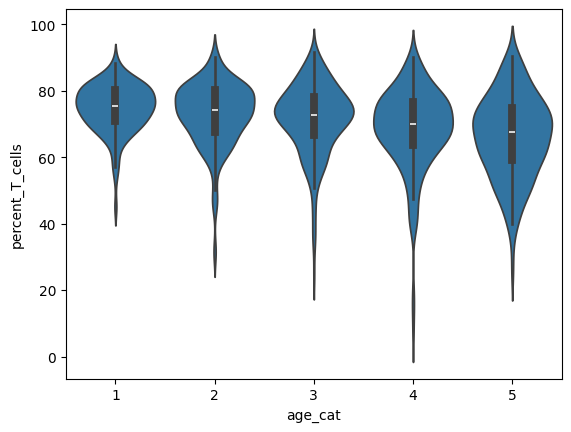

In [152]:
# sns.histplot(
#     data=pbulk_adata.obs,
#     x='percent_T_cells'
#     )

sns.scatterplot(
    data=pbulk_adata.obs,
    y='percent_T_cells',
    x='age'
    )
plt.show()

sns.violinplot(
    data=pbulk_adata.obs,
    y='percent_T_cells',
    x='age_cat',
    scale='width'
    )

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:827: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    ['1_1', '2_2', '3_3', '4_4', '6_6']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "obs")
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['MIR1302-2HG', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


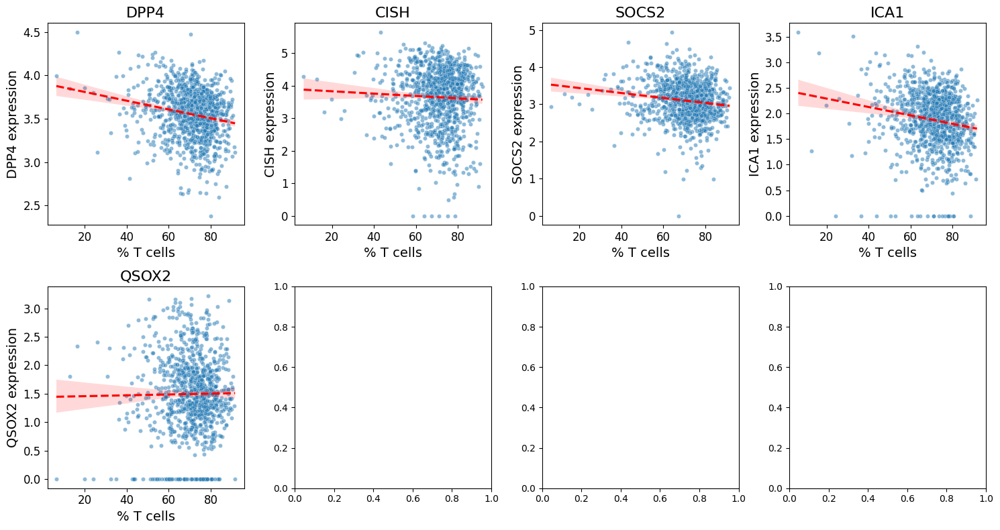

In [144]:
pbulk_adata.obs_names_make_unique()
pbulk_adata.var['ensembl_id'] = pbulk_adata.var.index
pbulk_adata.var_names = pbulk_adata.var['feature_name']

gs = ['DPP4', 'CISH', 'SOCS2','ICA1', 'QSOX2']
fig, axes = plt.subplots(2, 4, figsize=(15, 8))
axes = axes.flatten()
for i, g in enumerate(gs):
    gex_df = sc.get.obs_df(pbulk_adata, [g, 'percent_T_cells'], layer='log1p_norm')
    sns.scatterplot(data=gex_df, x='percent_T_cells', y=g, ax=axes[i], alpha=0.5, s=20)
    # Add regression line
    sns.regplot(data=gex_df, x='percent_T_cells', y=g, ax=axes[i], 
                scatter=False, color='red', line_kws={'linestyle':'--'})
    axes[i].tick_params(axis='x', labelsize=12)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].set_xlabel('% T cells', fontsize=14)
    axes[i].set_ylabel(f'{g} expression', fontsize=14)
    axes[i].set_title(g, fontsize=16)
plt.tight_layout()

In [62]:
lof_results = pd.read_table('/mnt/oak/users/mineto/workstation/250717_TcellPerturb/BurdenRegCor/GeneLevel/Stim48hr_Backman_LymphocyteCount_fullFeatures.per_gene_estimates.tsv_geneRegulation_correlation.txt')
lof_results.head()

,gene,ensg,P_withShet,beta_withShet,betaSE_withShet,P_pearson,R_pearson,R_pearson_CIlower,R_pearson_CIupper
0,TSPAN6,ENSG00000000003,0.986855,0.000158,0.009610,0.878478,0.001477,-0.017455,0.020408
1,DPM1,ENSG00000000419,0.006943,-0.025945,0.009609,0.003040,-0.028623,-0.047528,-0.009697
2,SCYL3,ENSG00000000457,0.463538,0.007044,0.009609,0.432246,0.007586,-0.011347,0.026514
3,C1orf112,ENSG00000000460,0.593118,-0.005135,0.009609,0.532267,-0.006033,-0.024961,0.012900
4,FGR,ENSG00000000938,0.749628,-0.003067,0.009609,0.804005,-0.002397,-0.021328,0.016535


In [63]:
# lof_results_signif = lof_results[['ensg', 'P_pearson', 'R_pearson']]
# lof_results_signif['LoF_signif'] = (lof_results_signif['P_withShet'] < 0.01) & (np.abs(lof_results_signif['R_pearson']) > 0.1)
# lof_results_signif['abs_R_pearson'] = lof_results_signif['R_pearson'].abs()

In [107]:
def get_odds_ratio(contingency):
    '''
    Odds ratio 
    '''
    # Perform Fisher's exact test to assess significance and get confidence intervals
    from scipy.stats import fisher_exact
    import numpy as np

    odds_ratio, pvalue = fisher_exact(contingency)

    # Calculate 95% confidence intervals for odds ratio
    # Using formula from Woolf's method
    a = contingency.loc[True, True]
    b = contingency.loc[True, False] 
    c = contingency.loc[False, True]
    d = contingency.loc[False, False]

    se = np.sqrt(1/a + 1/b + 1/c + 1/d)
    ci_lower = np.exp(np.log(odds_ratio) - 1.96*se)
    ci_upper = np.exp(np.log(odds_ratio) + 1.96*se)

    print(f"\nOdds ratio: {odds_ratio:.2f} (95% CI: {ci_lower:.2f}-{ci_upper:.2f})")
    print(f"P-value: {pvalue:.2e}")
    return odds_ratio, pvalue, ci_lower, ci_upper


Contingency table for p < 0.001:
LoF_signif       False  True 
DE_signif_0.001              
False            27726    753
True                42      4

Odds ratio: 3.51 (95% CI: 1.25-9.80)
P-value: 3.33e-02

Contingency table for p < 0.01:
LoF_signif      False  True 
DE_signif_0.01              
False           27662    747
True              106     10

Odds ratio: 3.49 (95% CI: 1.82-6.71)
P-value: 1.06e-03

Contingency table for p < 0.05:
LoF_signif      False  True 
DE_signif_0.05              
False           27525    732
True              243     25

Odds ratio: 3.87 (95% CI: 2.55-5.88)
P-value: 6.35e-08

Contingency table for p < 0.1:
LoF_signif     False  True 
DE_signif_0.1              
False          27380    720
True             388     37

Odds ratio: 3.63 (95% CI: 2.57-5.12)
P-value: 3.21e-10


/tmp/ipykernel_1826521/2849680509.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lof_results_signif['LoF_signif'] = (lof_results_signif['P_withShet'] < 0.05)  & (lof_results_signif['beta_withShet'] > 0)


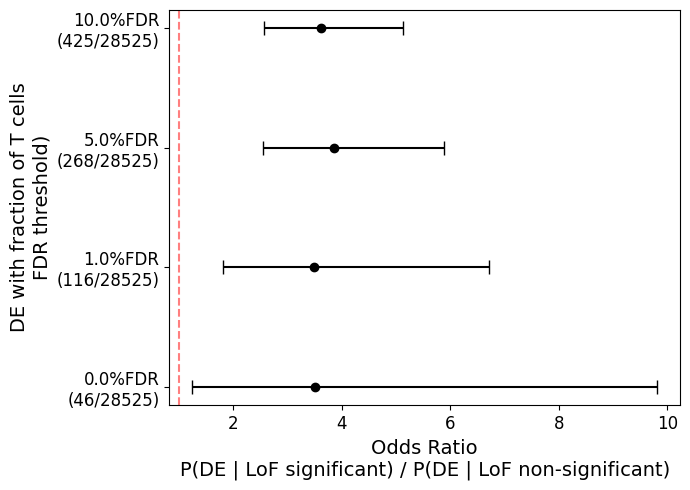

In [133]:
# Create binary indicators for significance at different thresholds
de_results_signif = res_df.dropna().rename({'variable':'ensg'}, axis=1)[['ensg', 'adj_p_value', 'log_fc']]
lof_results_signif = lof_results[['ensg', 'P_withShet', 'beta_withShet']]
lof_results_signif['LoF_signif'] = (lof_results_signif['P_withShet'] < 0.05)  & (lof_results_signif['beta_withShet'] > 0)

# Test different p-value thresholds
thresholds = [0.001, 0.01, 0.05, 0.1]
results = []

for threshold in thresholds:
    # Create binary indicator for this threshold
    de_results_signif[f'DE_signif_{threshold}'] = (de_results_signif['adj_p_value'] < threshold) & (de_results_signif['log_fc'] < 0)
    
    # Merge dataframes
    merged_df = pd.merge(de_results_signif[['ensg', f'DE_signif_{threshold}']], 
                        lof_results_signif[['ensg', 'LoF_signif']], 
                        on='ensg', how='left').fillna(False)
    
    # Create contingency table
    contingency = pd.crosstab(merged_df[f'DE_signif_{threshold}'], merged_df['LoF_signif'])
    print(f"\nContingency table for p < {threshold}:")
    print(contingency)
    
    # Calculate odds ratio and stats
    odds_ratio, pvalue, ci_lower, ci_upper = get_odds_ratio(contingency)
    
    # Store results
    results.append({
        'threshold': threshold,
        'odds_ratio': odds_ratio,
        'pvalue': pvalue,
        'ci_lower': ci_lower,
        'ci_upper': ci_upper,
        'n_de_signif': merged_df[f'DE_signif_{threshold}'].sum(),
        'n_total': len(merged_df)
    })

# Create results dataframe
results_df = pd.DataFrame(results)
results_df
# Plot odds ratios for different thresholds
plt.figure(figsize=(7,5))
plt.errorbar(results_df['odds_ratio'], range(len(results_df)),
             xerr=[results_df['odds_ratio'] - results_df['ci_lower'],
                   results_df['ci_upper'] - results_df['odds_ratio']],
             fmt='o', capsize=5, color='black')
plt.axvline(x=1, color='red', linestyle='--', alpha=0.5)
plt.yticks(range(len(results_df)), [f"{np.round(t*100, 0)}%FDR\n({n}/{tot})" for t,n,tot in 
           zip(results_df['threshold'], results_df['n_de_signif'], results_df['n_total'])], fontsize=12)
plt.ylabel('DE with fraction of T cells\nFDR threshold)', fontsize=14)
plt.xlabel('Odds Ratio\nP(DE | LoF significant) / P(DE | LoF non-significant)', fontsize=14)
plt.xticks(fontsize=12)
plt.tight_layout()
plt.show()

(array([-4., -3., -2., -1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 [Text(0, -4.0, '−4'),
  Text(0, -3.0, '−3'),
  Text(0, -2.0, '−2'),
  Text(0, -1.0, '−1'),
  Text(0, 0.0, '0'),
  Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6')])

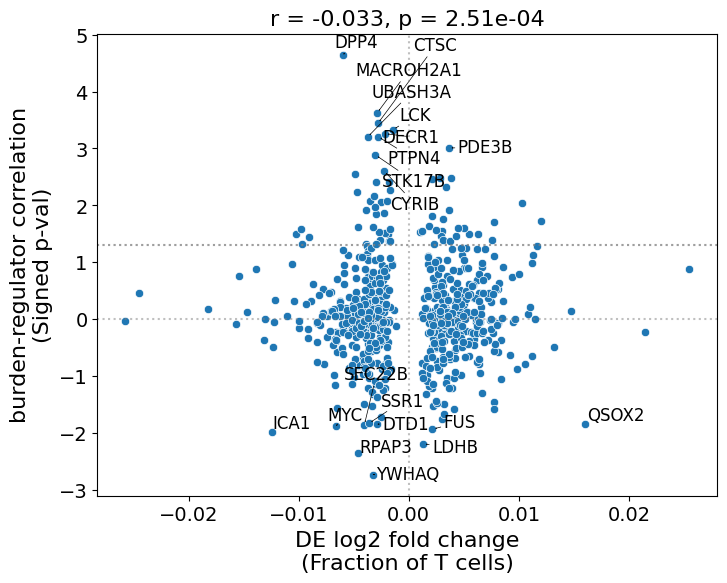

In [132]:
# Merge DE and LoF results
de_results_signif = res_df.dropna().rename({'variable':'ensg'}, axis=1)[['ensg', 'adj_p_value', 'log_fc', 'gene_name']]
lof_results_signif = lof_results[['ensg', 'P_withShet', 'beta_withShet']]

merged_df = pd.merge(de_results_signif[['ensg', 'log_fc', 'adj_p_value', 'gene_name']], 
                    lof_results_signif[['ensg', 'P_withShet', 'beta_withShet']], 
                    on='ensg', how='inner')
merged_df['signed_P_withShet'] = -np.log10(merged_df['P_withShet']) * np.sign(merged_df['beta_withShet'])

# Calculate correlation coefficient and p-value
from scipy import stats
r, p = stats.pearsonr(merged_df['log_fc'], merged_df['signed_P_withShet'])

# Create scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=merged_df[merged_df['adj_p_value'] < 0.1], x='log_fc', y='signed_P_withShet')

# Add horizontal dotted lines at y=0, 1, and -1
plt.axvline(x=0, color='gray', linestyle=':', alpha=0.5)
plt.axhline(y=0, color='gray', linestyle=':', alpha=0.5)
plt.axhline(y=-np.log10(0.05), color='gray', linestyle=':', alpha=0.5)
plt.axhline(y=-np.log10(0.05), color='gray', linestyle=':', alpha=0.5)

# Get top genes by absolute log fold change
top_genes = merged_df[merged_df['adj_p_value'] < 0.1].nlargest(10, 'signed_P_withShet')
bot_genes = merged_df[merged_df['adj_p_value'] < 0.1].nsmallest(10, 'signed_P_withShet')
top_genes = pd.concat([top_genes, bot_genes])

# Add gene labels with adjustText to avoid overlap
from adjustText import adjust_text

texts = []
for _, gene in top_genes.iterrows():
    texts.append(plt.text(gene['log_fc'], gene['signed_P_withShet'], 
                         gene['gene_name'], fontsize=12))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5))

plt.xlabel('DE log2 fold change\n(Fraction of T cells)', fontsize=16)
plt.ylabel('burden-regulator correlation\n(Signed p-val)', fontsize=16)
plt.title(f'r = {r:.3f}, p = {p:.2e}', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

In [347]:
de_gs = de_results_signif[de_results_signif['adj_p_value'] < 0.1].ensg.unique()
lof_results['DE_gene'] = lof_results['ensg'].isin(de_gs)
lof_results.sort_values("P_withShet")[0:50]

,gene,ensg,P_withShet,beta_withShet,betaSE_withShet,P_pearson,R_pearson,R_pearson_CIlower,R_pearson_CIupper,DE_gene
3469,IL18R1,ENSG00000115604,7.218351e-07,0.047610,0.009602,0.000004,0.044622,0.025712,0.063500,False
9257,ITGAM,ENSG00000169896,3.728092e-06,0.044474,0.009609,0.000038,0.039805,0.020890,0.058692,False
8369,SAMD3,ENSG00000164483,5.854221e-06,0.043531,0.009601,0.000016,0.041703,0.022790,0.060587,False
12446,FAM237A,ENSG00000235118,1.043929e-05,0.370215,0.080851,0.000008,0.369077,0.215840,0.504571,False
9709,CYSLTR1,ENSG00000173198,1.302260e-05,0.041888,0.009603,0.000048,0.039270,0.020354,0.058158,False
139,SLC13A2,ENSG00000007216,1.967830e-05,-0.216696,0.050125,0.000027,-0.212567,-0.306250,-0.114806,False
11644,DPP4,ENSG00000197635,2.231702e-05,0.040764,0.009609,0.000160,0.036447,0.017528,0.055340,True
3756,VAMP8,ENSG00000118640,3.789648e-05,0.039586,0.009604,0.000013,0.042119,0.023206,0.061001,False
5310,BIVM,ENSG00000134897,5.828683e-05,0.038614,0.009602,0.000108,0.037381,0.018463,0.056272,False
8772,STX3,ENSG00000166900,9.938451e-05,0.037399,0.009605,0.000324,0.034717,0.015796,0.053613,False


### Read perturb-seq results

In [179]:
# Import utility functions from DE_analysis_utils.py
import sys
sys.path.append(os.path.abspath('../3_DE_analysis'))
from DE_analysis_utils import get_DE_results_long


In [180]:
datadir = '/mnt/oak/users/emma/data/GWT/CD4i_final/'
experiment_name = 'CD4i_final'
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results.h5ad')

adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 50)] = 50
for cond in adata_de.obs.culture_condition.unique():
    affected_gs_cond = np.sum(adata_de[adata_de.obs['culture_condition'] == cond].layers['adj_p_value'] < 0.1, axis=0)
    adata_de.var[f'n_signif_effects_{cond}'] = affected_gs_cond
    
adata_de.var_names = adata_de.var['gene_name'].values
adata_de.var_names

Index(['TSPAN6', 'DPM1', 'SCYL3', 'C1orf112', 'FGR', 'CFH', 'FUCA2', 'GCLC',
       'NFYA', 'STPG1',
       ...
       'ARHGAP11B', 'LINC02929', 'CDR1', 'PRRC2B', 'F8A1', 'HOMEZ', 'C2orf83',
       'ENSG00000290797', 'ENSG00000291096', 'SOD2'],
      dtype='object', length=13959)

In [181]:
# Load summary stats
DE_stats = pd.read_csv(datadir + f'/DE_results_all_confounders/DE_summary_stats_per_target.csv', index_col=0)
DE_stats = DE_stats[DE_stats['condition'] == 'Rest']
keep_targets = DE_stats[ (DE_stats.n_total_de_genes > 1)].target_name.tolist()
print(len(keep_targets))

adata_de = adata_de[adata_de.obs['target_contrast_gene_name'].isin(keep_targets)].copy()

6896


In [182]:
adata_de

AnnData object with n_obs × n_vars = 20490 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target'
    var: 'gene_ids', 'gene_name', 'n_signif_effects_Stim8hr', 'n_signif_effects_Stim48hr', 'n_signif_effects_Rest'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

## Train model on perturbation effetcs

In [229]:
from pert2state_model.Perturb2StateModel import Perturb2StateModel

In [230]:
def eval_splits_on_repl(model, X_perturbs, y_target, y_target_repl, state_name=None):
    """
    Calculate correlations between predictions and true values for each split of a model.
    
    Parameters
    ----------
    model : object
        Model object with get_prediction() and split_ixs attributes
    y_target : pd.Series
        Target values used for training
    y_target_repl : pd.Series
        Replicate target values to compare against
    state_name : str, optional
        Name of the state to include in output dataframe
        
    Returns
    -------
    pd.DataFrame
        DataFrame containing correlation metrics for each split
    """
    # Get predictions for each split
    splits_pred = model.get_prediction(X_perturbs, return_splits=True)
    
    # Get test indices for each split
    test_indices = [x[1] for x in model.split_ixs]
    
    # Compare predictions to true values for each test split
    all_split_corrs = None
    for i, test_idx in enumerate(test_indices):
        # Get predictions for this split from the corresponding column
        test_pred = splits_pred.iloc[test_idx, i]
        test_true = y_target_repl.iloc[test_idx]
        test_input = y_target.iloc[test_idx]
        
        # Calculate correlation for this split
        corr = np.corrcoef(test_pred, test_true)[0,1]
        top_corr = np.corrcoef(test_input, test_true)[0,1]
        
        # Store correlation in dataframe
        split_corr_df = pd.DataFrame({
            'split': i,
            'correlation': corr,
            'upper_correlation': top_corr,
            'state': state_name
        }, index=[0])
        
        if all_split_corrs is None:
            all_split_corrs = split_corr_df
        else:
            all_split_corrs = pd.concat([all_split_corrs, split_corr_df])
            
    return all_split_corrs

### Reconstruction performance

Common genes between target and adata_de: 1289

Training models for condition: Stim8hr
Perturbation matrix shape: (1289, 6846)
Training model with 50 PCs, 5 splits, 1 repeats
Model training for age completed successfully

Training models for condition: Stim48hr
Perturbation matrix shape: (1289, 6748)
Training model with 50 PCs, 5 splits, 1 repeats
Model training for age completed successfully

Training models for condition: Rest
Perturbation matrix shape: (1289, 6896)
Training model with 50 PCs, 5 splits, 1 repeats
Model training for age completed successfully
Common genes between target and adata_de: 4371

Training models for condition: Stim8hr
Perturbation matrix shape: (4371, 6846)
Training model with 50 PCs, 5 splits, 1 repeats
Model training for age completed successfully

Training models for condition: Stim48hr
Perturbation matrix shape: (4371, 6748)
Training model with 50 PCs, 5 splits, 1 repeats
Model training for age completed successfully

Training models for condition: Rest


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.150e-01, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.429e+00, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

Model training for age completed successfully

Training models for condition: Stim48hr
Perturbation matrix shape: (54, 6748)
Training model with 50 PCs, 5 splits, 1 repeats


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.588e+00, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.254e+01, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

Model training for age completed successfully

Training models for condition: Rest
Perturbation matrix shape: (54, 6896)
Training model with 50 PCs, 5 splits, 1 repeats


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.335e+00, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.181e+00, tolerance: 4.406e-01
  model = cd_fast.enet_coordinate_descent(
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

Model training for age completed successfully


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


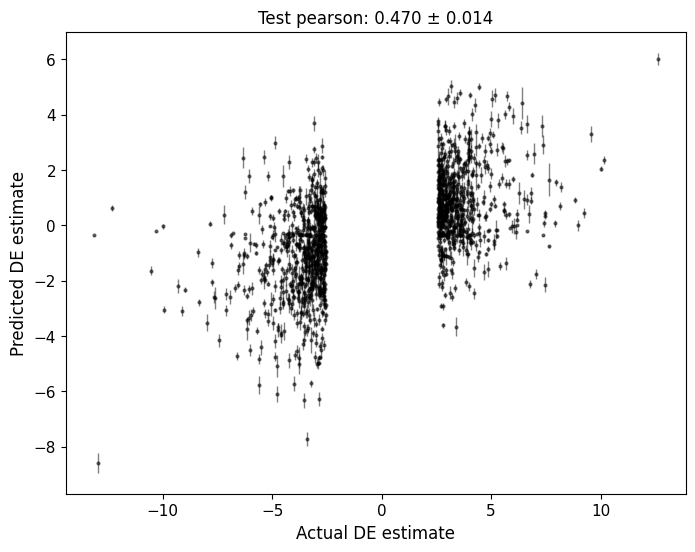

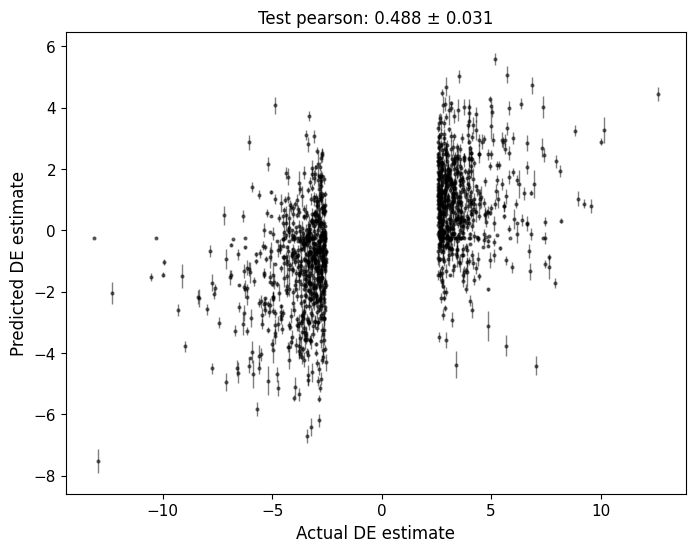

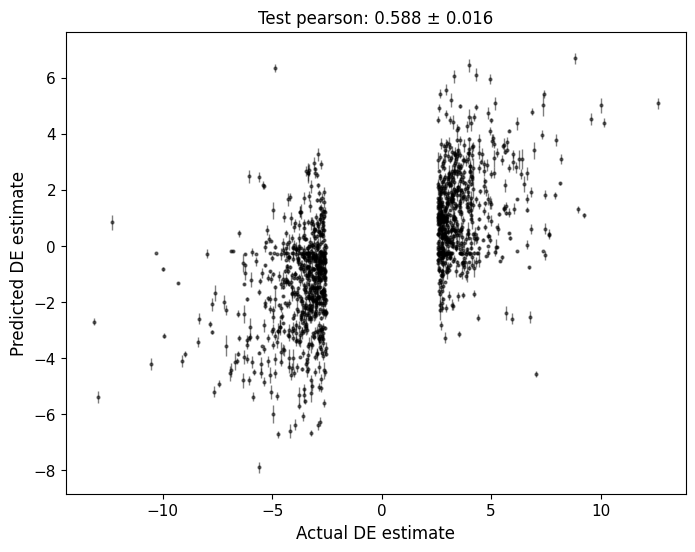

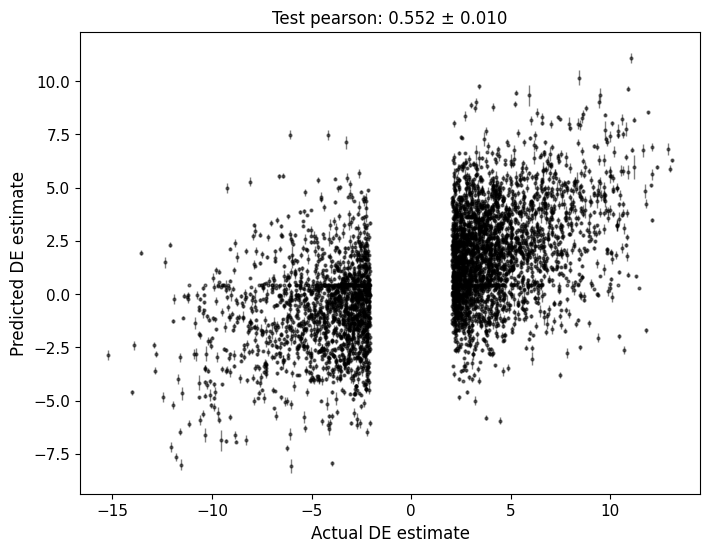

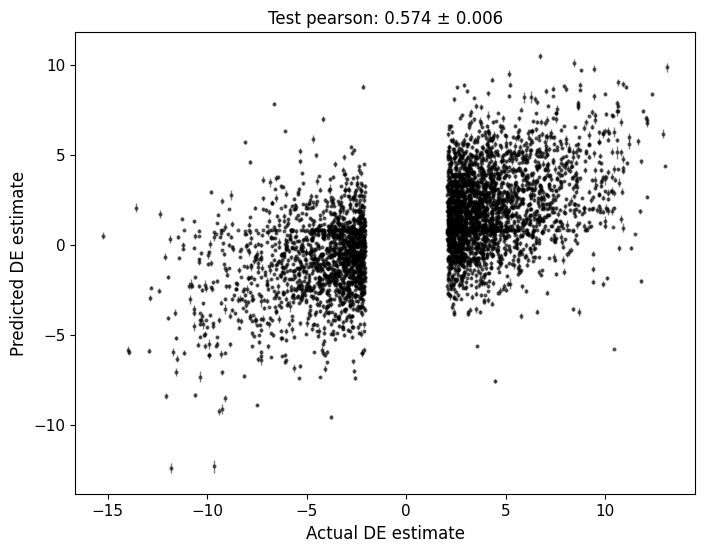

...

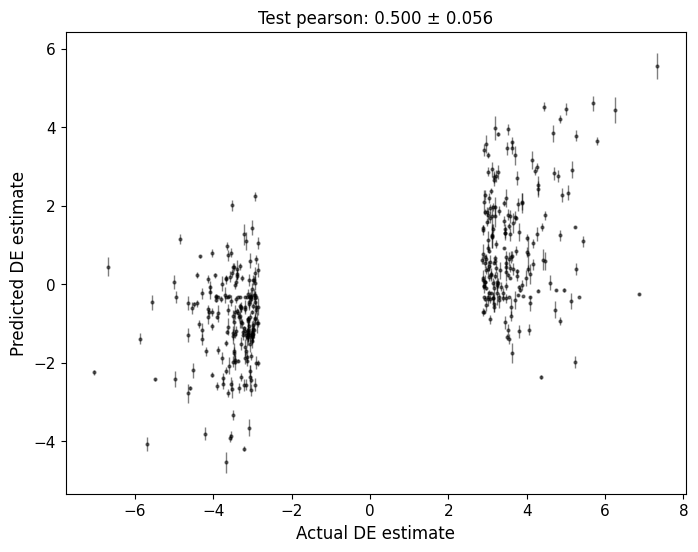

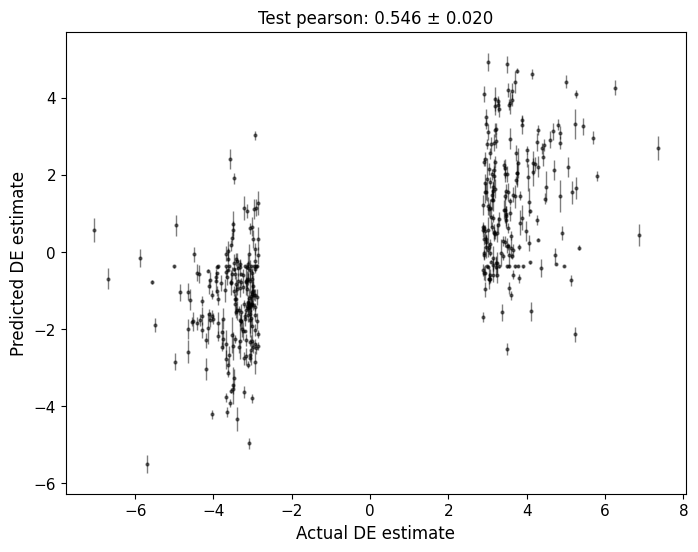

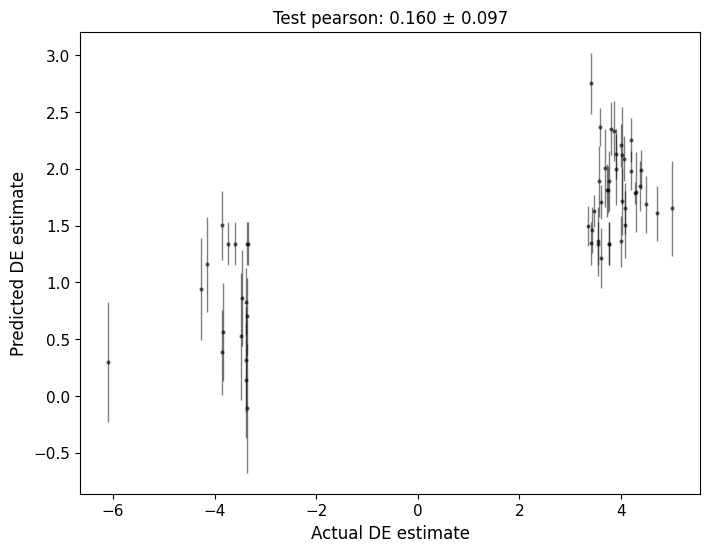

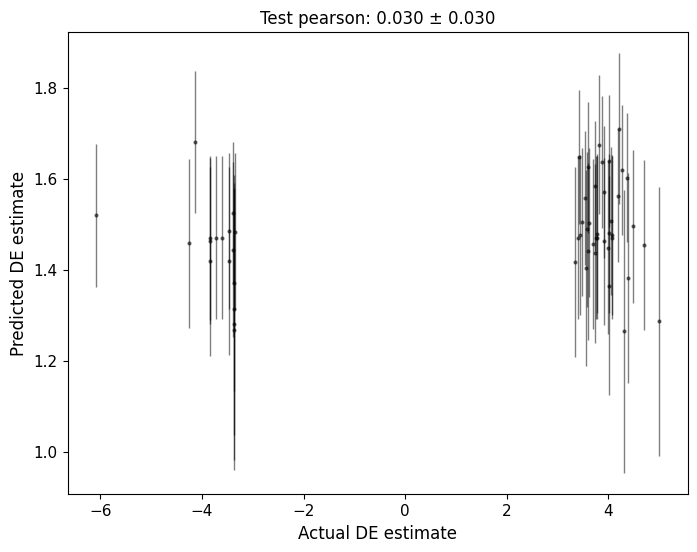

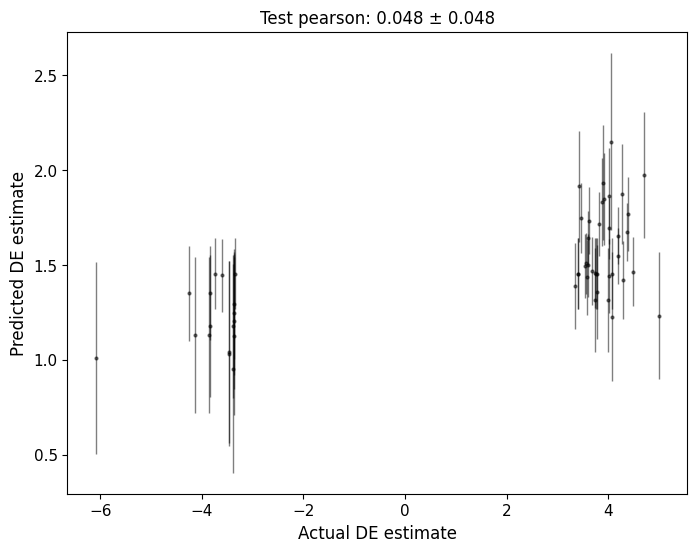

In [231]:
ct_classes = ['CD4T', 'CD8T', 'NK', 'B']
perturb_layer = 'zscore'
target_state = 'age'
signif_zscore = 0
n_pcs=50
n_splits=5
n_repeats=1

results_df = pd.DataFrame()
models = {}

for ct in ct_classes:
    train_df = train_results[ct]
    train_df['contrast'] = target_state

    # Get target state values
    y_target = train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
    y_target = y_target[train_df.pivot_table(index='gene_name', columns='contrast', values='adj_p_value')[target_state] < 0.1]
    # y_target = y_target[train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state].abs() > 0.5]
    val_df = val_results[ct]
    val_df['contrast'] = target_state
    y_target_val = val_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
    common_genes = np.intersect1d(y_target.index, y_target_val.index)
    y_target_val = y_target_val.loc[common_genes]
    y_target = y_target.loc[common_genes]
    
    # Find common genes between all DE results
    common_gs = np.intersect1d(y_target.index, adata_de.var_names)
    print(f"Common genes between target and adata_de: {len(common_gs)}")
    y_target = y_target.loc[common_gs]

    # Train models for each condition
    for cond in adata_de.obs.culture_condition.unique():
        print(f"\nTraining models for condition: {cond}")
        
        # Get responses for this condition
        X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                                ['target_contrast_gene_name'] + list(common_gs), 
                                layer=perturb_layer)
        X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T
        print(f"Perturbation matrix shape: {X_perturbs.shape}")

        # Mask effects in cis and based on zscore thresh
        X_perturbs_masked = X_perturbs.copy()
        mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
        # Mask cis effects
        for idx in X_perturbs_masked.index:
            if idx in X_perturbs_masked.columns:
                mask.loc[idx, idx] = True
        # Mask non-significant effects
        # mask = mask | (np.abs(X_perturbs) < signif_zscore)
        X_perturbs_masked = X_perturbs_masked.mask(mask)
        # Impute masked values with column means
        X_perturbs_masked = X_perturbs_masked.fillna(0)

        # Train main model
        print(f"Training model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
        p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
        p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{ct}_{cond}', stratify_y=False)
        models[f'{ct}_{cond}'] = p2t_model
        p2t_model.plot_prediction(X_perturbs_masked, y_target, plot_metric='pearson')
        print(f"Model training for {target_state} completed successfully")

        # Eval on validation set
        y_target_val = y_target_val.loc[common_gs]
        val_reconstr = eval_splits_on_repl(p2t_model,X_perturbs_masked, y_target, y_target_val, state_name=cond)
        val_reconstr['cell_type_class'] = ct
        val_reconstr['target_data'] = 'validation'
        results_df = pd.concat([results_df, val_reconstr])


In [232]:
import pickle
with open('aging_models.pkl', 'wb') as f:
    pickle.dump(models, f)

Common genes between target and adata_de: 1289
Perturbation matrix shape: (1289, 6896)


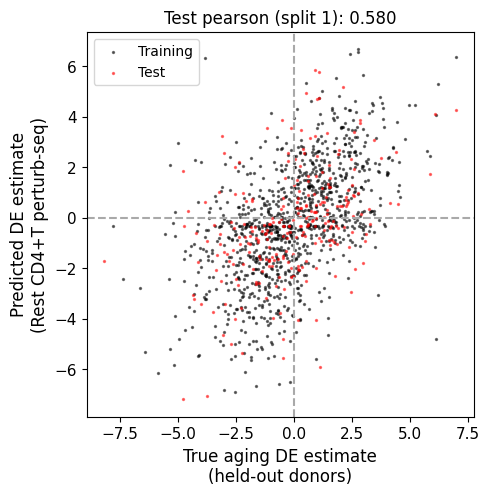

In [233]:
ct = 'CD4T'
cond = 'Rest'
p2t_model = models[f'{ct}_{cond}']

train_df = train_results[ct]
train_df['contrast'] = target_state
y_target = train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
y_target = y_target[train_df.pivot_table(index='gene_name', columns='contrast', values='adj_p_value')[target_state] < 0.1]

val_df = val_results[ct]
val_df['contrast'] = target_state
y_target_val = val_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
common_genes = np.intersect1d(y_target.index, y_target_val.index)
y_target_val = y_target_val.loc[common_genes]
y_target = y_target.loc[common_genes]

common_gs = np.intersect1d(y_target.index, adata_de.var_names)
print(f"Common genes between target and adata_de: {len(common_gs)}")
y_target = y_target.loc[common_gs]
y_target_val = y_target_val.loc[common_gs]

val_df = val_results[ct]
val_df['contrast'] = target_state
y_target_val = val_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
common_genes = np.intersect1d(y_target.index, y_target_val.index)

# Get responses for this condition
X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                        ['target_contrast_gene_name'] + list(common_gs), 
                        layer=perturb_layer)
X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T
print(f"Perturbation matrix shape: {X_perturbs.shape}")

# Mask effects in cis
X_perturbs_masked = X_perturbs.copy()
mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
for idx in X_perturbs_masked.index:
    if idx in X_perturbs_masked.columns:
        mask.loc[idx, idx] = True
X_perturbs_masked = X_perturbs_masked.mask(mask)
X_perturbs_masked = X_perturbs_masked.fillna(0)

y_target_val = y_target_val.loc[common_genes]
y_target = y_target.loc[common_genes]

fig, axes = plt.subplots(1, 1, figsize=(5, 5))
p2t_model.plot_prediction(X_perturbs_masked, y_target_val, split_id=1, return_ax=True, ax=axes, plot_metric='pearson')
axes.set_ylabel('Predicted DE estimate\n(Rest CD4+T perturb-seq)', fontsize=12)
axes.set_xlabel(f'True aging DE estimate\n(held-out donors)', fontsize=12)
axes.axhline(y=0, color='darkgrey', linestyle='--')
axes.axvline(x=0, color='darkgrey', linestyle='--')

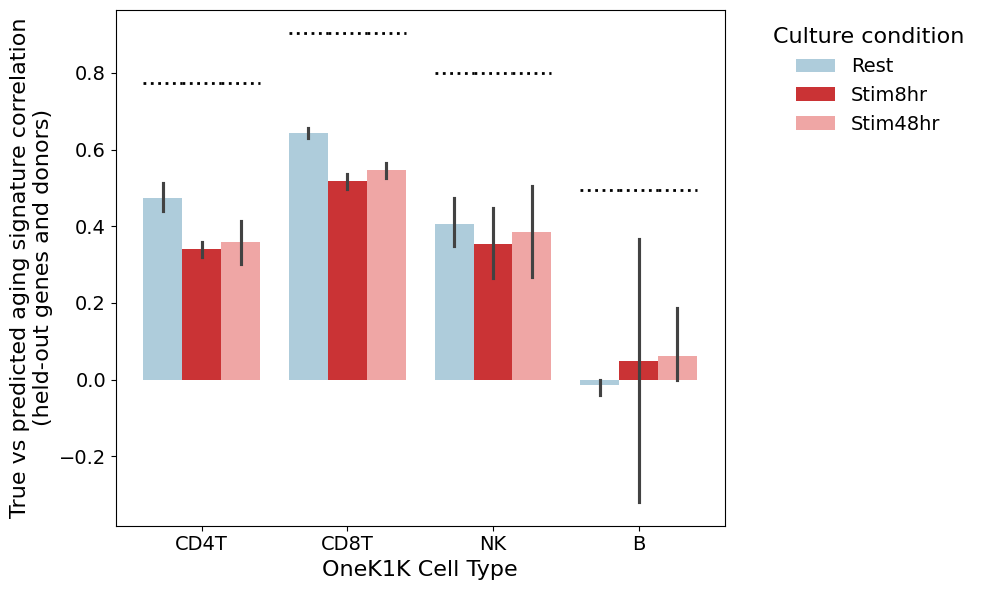

In [234]:
fig, ax = plt.subplots(figsize=(10,6))

# Create barplot
sns.barplot(data=results_df.fillna(0), y='correlation', x='cell_type_class', hue='state',
            ax=ax, palette=palettes['culture_condition'],
            hue_order=['Rest', 'Stim8hr', 'Stim48hr'])
# # Add stripplot
# sns.stripplot(data=results_df.fillna(0), y='correlation', x='cell_type_class', hue='state',
#               dodge=True, ax=ax, size=4, alpha=0.4, color='black',
#               hue_order=['Rest', 'Stim8hr', 'Stim48hr'], legend=False)

# Add dotted lines for upper correlation values
for cell_type in results_df.cell_type_class.unique():
    cell_type_data = results_df[results_df.cell_type_class == cell_type]
    for i, state in enumerate(['Rest', 'Stim8hr', 'Stim48hr']):
        state_data = cell_type_data[cell_type_data.state == state]
        if not state_data.empty:
            x_pos = ax.get_xticks()[list(results_df.cell_type_class.unique()).index(cell_type)]
            # Adjust x position based on hue position
            width = 0.8 / 3  # Approximate width of each hue bar
            x_adj = x_pos - width + (i * width)
            upper_corr = state_data.upper_correlation.mean()
            ax.hlines(y=upper_corr, xmin=x_adj-width/2, xmax=x_adj+width/2, 
                     colors='black', linestyles='dotted', linewidth=2)

# Customize fonts and labels
plt.xlabel('OneK1K Cell Type', fontsize=16)
plt.ylabel('True vs predicted aging signature correlation\n(held-out genes and donors)', fontsize=16) 
ax.tick_params(axis='both', labelsize=14)

# Adjust legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, frameon=False, title='Culture condition', title_fontsize=16)
plt.tight_layout()


In [299]:
train_results['CD4T']

,baseMean,log_fc,lfcSE,stat,pvalue,adj_p_value,variable,gene_name,perturbseq_gene,zscore,contrast
ENSG00000238009,0.318620,-0.052778,0.080545,-0.655257,0.512303,1.000000,ENSG00000238009,RP11-34P13.7,False,-0.655257,age
ENSG00000239945,0.011348,-0.036128,0.765537,-0.047193,0.962359,1.000000,ENSG00000239945,RP11-34P13.8,False,-0.047193,age
ENSG00000241860,0.622532,-0.030683,0.060456,-0.507536,0.611779,0.857848,ENSG00000241860,RP11-34P13.13,False,-0.507536,age
ENSG00000229905,0.001499,-0.013146,1.342818,-0.009790,0.992189,1.000000,ENSG00000229905,RP11-206L10.4,False,-0.009790,age
ENSG00000237491,9.739420,-0.006240,0.017088,-0.365136,0.715010,0.902476,ENSG00000237491,LINC01409,False,-0.365136,age
...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000212907,160.197194,-0.004812,0.009878,-0.487195,0.626120,0.864204,ENSG00000212907,MT-ND4L,False,-0.487195,age
ENSG00000198886,3911.353018,-0.017624,0.005975,-2.949773,0.003180,0.043522,ENSG00000198886,MT-ND4,False,-2.949773,age
ENSG00000198786,1066.409492,-0.010382,0.008622,-1.204122,0.228542,0.571701,ENSG00000198786,MT-ND5,False,-1.204122,age
ENSG00000198695,50.566550,-0.011674,0.009870,-1.182835,0.236874,0.582044,ENSG00000198695,MT-ND6,False,-1.182835,age


Common genes between target and adata_de: 4371


/tmp/ipykernel_3338103/2292870418.py:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = prediction_results.groupby('signature_type').apply(



Correlations between age and predicted effects by signature type:
                correlation  n_genes
signature_type                      
CD8-specific       0.651532   3541.0
Shared             0.692608    715.0


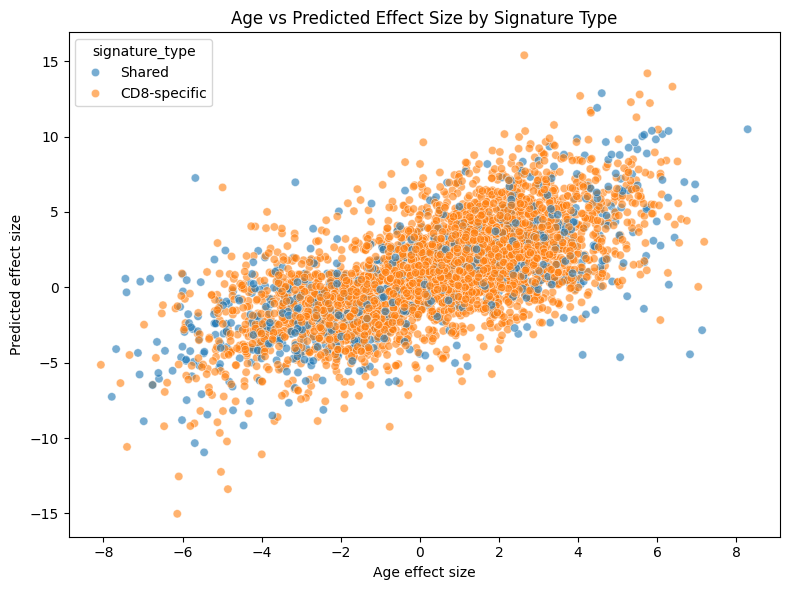

In [305]:
signif_CD4 = train_results['CD4T'][train_results['CD4T']['adj_p_value'] < 0.1]['gene_name']
signif_CD8 = train_results['CD8T'][train_results['CD8T']['adj_p_value'] < 0.1]['gene_name']
signature_CD4_specific = np.setdiff1d(signif_CD4, signif_CD8)
signature_CD8_specific = np.setdiff1d(signif_CD8, signif_CD4)
signature_shared = np.intersect1d(signif_CD4, signif_CD8)

ct = 'CD8T'
cond = 'Rest'
p2t_model = models[f'{ct}_{cond}']

train_df = train_results[ct]
train_df['contrast'] = target_state
y_target = train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
y_target = y_target[train_df.pivot_table(index='gene_name', columns='contrast', values='adj_p_value')[target_state] < 0.1]

val_df = val_results[ct]
val_df['contrast'] = target_state
y_target_val = val_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
common_genes = np.intersect1d(y_target.index, y_target_val.index)
y_target_val = y_target_val.loc[common_genes]
y_target = y_target.loc[common_genes]

common_gs = np.intersect1d(y_target.index, adata_de.var_names)
print(f"Common genes between target and adata_de: {len(common_gs)}")
y_target = y_target.loc[common_gs]
y_target_val = y_target_val.loc[common_gs]

val_df = val_results[ct]
val_df['contrast'] = target_state
y_target_val = val_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
common_genes = np.intersect1d(y_target.index, y_target_val.index)

# Get responses for this condition
X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                        ['target_contrast_gene_name'] + list(common_gs), 
                        layer=perturb_layer)
X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T

prediction_results = p2t_model.get_prediction(X_perturbs.dropna())
prediction_results = pd.concat([prediction_results, y_target_val], axis=1).dropna()
# Add column to annotate genes as shared or CD4-specific
prediction_results['signature_type'] = 'Other'
prediction_results.loc[prediction_results.index.isin(signature_shared), 'signature_type'] = 'Shared'
if ct == 'CD8T':
    prediction_results.loc[prediction_results.index.isin(signature_CD8_specific), 'signature_type'] = 'CD8-specific'
elif ct == 'CD4T':
    prediction_results.loc[prediction_results.index.isin(signature_CD4_specific), 'signature_type'] = 'CD4-specific'
# Compute correlations between age and pred_mean for each signature type
correlations = prediction_results.groupby('signature_type').apply(
    lambda x: pd.Series({
        'correlation': x['age'].corr(x['pred_mean']),
        'n_genes': len(x)
    })
)
print("\nCorrelations between age and predicted effects by signature type:")
print(correlations)

plt.figure(figsize=(8,6))
sns.scatterplot(data=prediction_results, x='age', y='pred_mean', hue='signature_type', alpha=0.6)
plt.xlabel('Age effect size')
plt.ylabel('Predicted effect size')
plt.title('Age vs Predicted Effect Size by Signature Type')
plt.tight_layout()


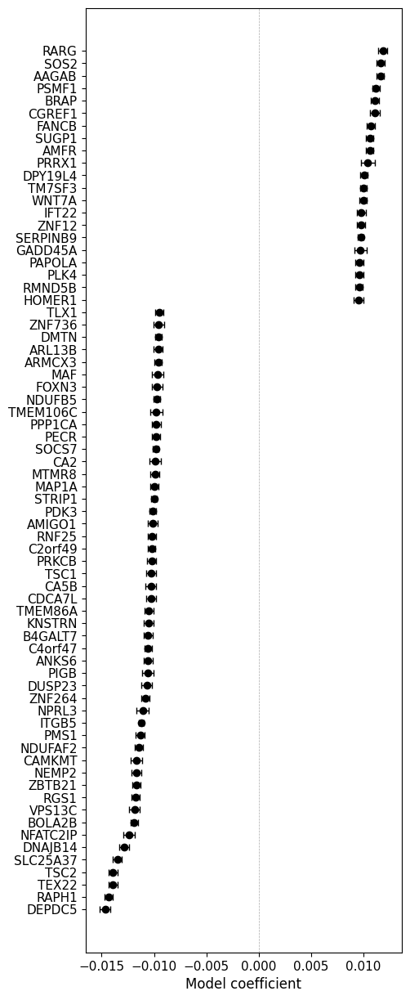

In [350]:
ct = 'CD4T'
cond = 'Rest'
p2t_model = models[f'{ct}_{cond}']
p = p2t_model.plot_coefs(top_n=70, figsize=(5,15))

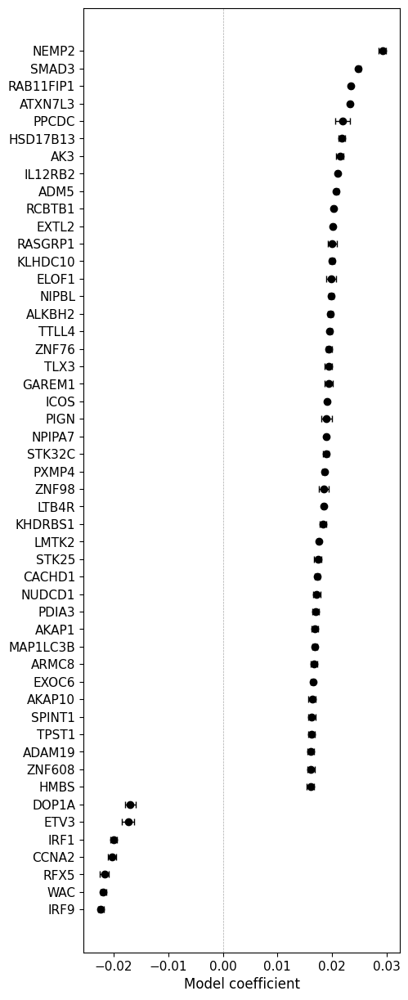

In [351]:
ct = 'CD8T'
cond = 'Rest'
p2t_model = models[f'{ct}_{cond}']
p = p2t_model.plot_coefs(top_n=50, figsize=(5,15))

Compare baseline expression

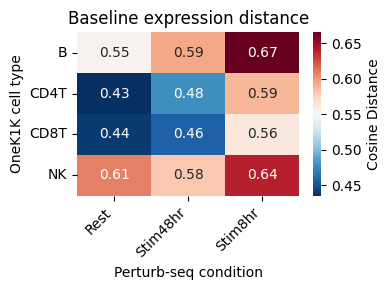

In [235]:
# Comparison of baseline mean expression
pseq_base_means = get_DE_results_long(adata_de, targets=['GATA3'], effect_estimates='baseMean', gene_id_col='gene_ids')
pseq_base_means = pseq_base_means.pivot(columns='culture_condition', index='gene_ids', values='baseMean').dropna()
onek1k_base_means = pd.concat([x[['variable', 'baseMean']].set_index('variable').rename({'baseMean':k}, axis=1) for k,x in train_results.items()], axis=1)
all_base_means = pd.concat([pseq_base_means, onek1k_base_means], axis=1).dropna()
from scipy.spatial.distance import pdist, squareform
base_means_dist = pd.DataFrame(squareform(pdist(all_base_means.T)), 
                             index=all_base_means.columns,
                             columns=all_base_means.columns)
pseq_cols = pseq_base_means.columns
onek1k_cols = onek1k_base_means.columns

# Calculate cosine distances between conditions
from scipy.spatial.distance import cosine
dist_long = pd.DataFrame([
    {'onek1k_condition': col1,
     'pseq_condition': col2, 
     'distance': cosine(all_base_means[col1], all_base_means[col2])}
    for col1 in onek1k_cols
    for col2 in pseq_cols
])

# Create heatmap
plt.figure(figsize=(4,3))
sns.heatmap(data=dist_long.pivot(index='onek1k_condition', columns='pseq_condition', values='distance'),
            cmap='RdBu_r', annot=True, fmt='.2f',
            cbar_kws={'label': 'Cosine Distance'})
plt.xticks(rotation=45, ha='right');
plt.yticks(rotation=0);
plt.xlabel('Perturb-seq condition');
plt.ylabel('OneK1K cell type');
plt.title('Baseline expression distance');
plt.tight_layout()

<Axes: >

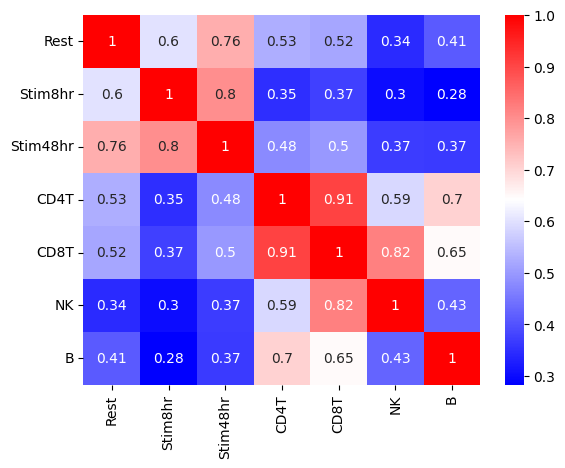

In [236]:
sns.heatmap(all_base_means.corr(), cmap='bwr', annot=True)

In [314]:
# # Get top 20 components and plot as heatmap
# components = p2t_model.pcas[0].components_[:20]
# plt.figure(figsize=(12, 8))
# sns.clustermap(components, cmap='RdBu_r', center=0)
# plt.xlabel('Genes')
# plt.ylabel('PC')
# plt.title('Top 20 Principal Components')

## Train best model

Common genes between target and adata_de: 532

Training models for condition: Rest
Perturbation matrix shape: (532, 6896)
Training model with 50 PCs, 5 splits, 3 repeats
Model training for age completed successfully


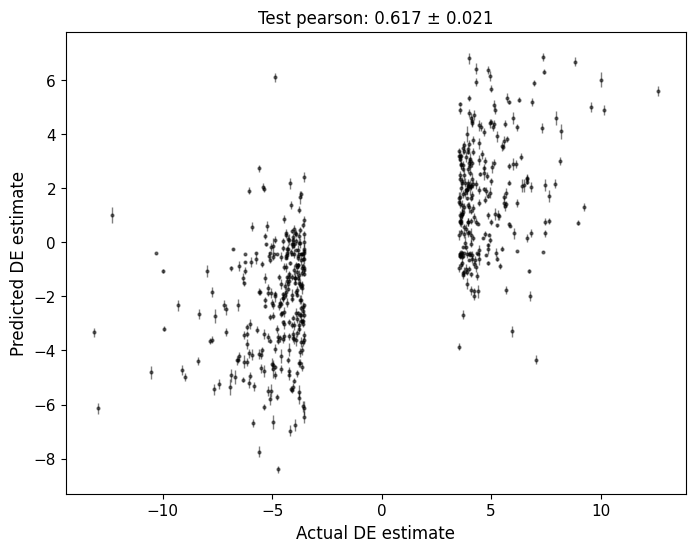

In [352]:
perturb_layer = 'zscore'
target_state = 'age'
signif_zscore = 0
n_pcs=50
n_splits=5
n_repeats=3

ct = 'CD4T'
cond = 'Rest'

train_df = train_results[ct]
train_df['contrast'] = target_state

# Get target state values
y_target = train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
y_target = y_target[train_df.pivot_table(index='gene_name', columns='contrast', values='adj_p_value')[target_state] < 0.01]
common_genes = np.intersect1d(y_target.index, y_target_val.index)
y_target = y_target.loc[common_genes]

# Find common genes between all DE results
common_gs = np.intersect1d(y_target.index, adata_de.var_names)
print(f"Common genes between target and adata_de: {len(common_gs)}")
y_target = y_target.loc[common_gs]

print(f"\nTraining models for condition: {cond}")

# Get responses for this condition
X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                        ['target_contrast_gene_name'] + list(common_gs), 
                        layer=perturb_layer)
X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T
print(f"Perturbation matrix shape: {X_perturbs.shape}")

# Mask effects in cis and based on zscore thresh
X_perturbs_masked = X_perturbs.copy()
mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
# Mask cis effects
for idx in X_perturbs_masked.index:
    if idx in X_perturbs_masked.columns:
        mask.loc[idx, idx] = True
# Mask non-significant effects
# mask = mask | (np.abs(X_perturbs) < signif_zscore)
X_perturbs_masked = X_perturbs_masked.mask(mask)
# Impute masked values with column means
X_perturbs_masked = X_perturbs_masked.fillna(0)

# Train main model
print(f"Training model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{ct}_{cond}', stratify_y=False)
models[f'{ct}_{cond}'] = p2t_model
p2t_model.plot_prediction(X_perturbs_masked, y_target, plot_metric='pearson')
print(f"Model training for {target_state} completed successfully")


In [224]:
## Need to test robustness of coefficients

<Axes: xlabel='Model coefficient'>

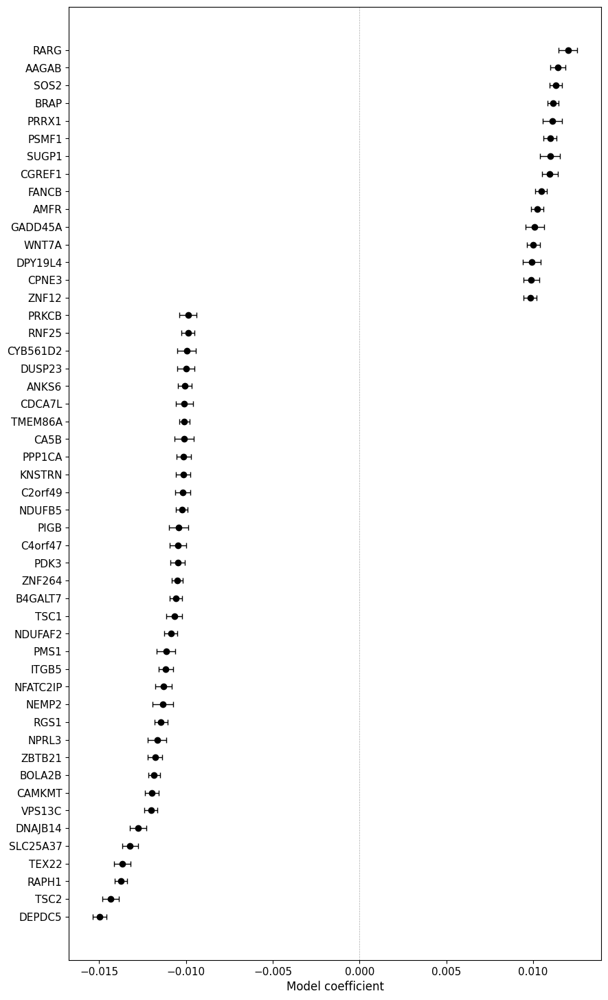

In [355]:
fig, ax = plt.subplots(1, 1, figsize=(10, 18))
p2t_model.plot_coefs(top_n=50,ax=ax, return_ax=True,  show_labels=True)

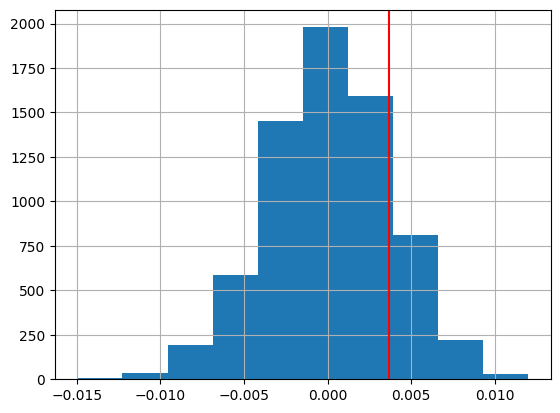

In [354]:
coefs_df = p2t_model.get_coefs()

coefs_df['coef_mean'].hist()
plt.axvline(coefs_df.loc['MED12'][0], color='red')

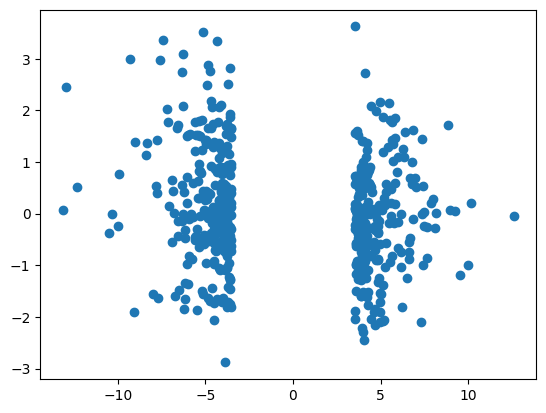

In [332]:
# Get target state values
y_target = train_df.pivot_table(index='gene_name', columns='contrast', values=perturb_layer)[target_state]
y_target = y_target.loc[common_gs]
plt.scatter(y_target, X_perturbs['ZBTB21'])

In [335]:
X_perturbs['ZBTB21'].dropna().sort_values()

TXNDC5     -2.882232
CBFB       -2.439160
SOGA3      -2.291846
LPGAT1     -2.209595
MB21D2     -2.162111
              ...   
ADA         3.089173
SLC25A6     3.340615
MARCKSL1    3.369515
JAML        3.515074
SNN         3.625827
Name: ZBTB21, Length: 525, dtype: float64

### Plot DE effects of predicted regulators

In [418]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

st = 'age'
top_quant = 0.005
alpha = 0.01
c = "Rest"

# Get top DE genes for input signature
train_df = train_results[ct]
train_df['contrast'] = target_state

# Get target state values
state_results_df = train_df
signature_effect_size = state_results_df[(state_results_df['adj_p_value'] < alpha) & 
                                       (abs(state_results_df['zscore']) > 5)].sort_values('zscore')
signature_gs = signature_effect_size.gene_name.tolist()

# Get top and bottom 10% of coefficient values
n = len(p2t_model.get_coefs()['coef_mean'])
st_coefs = p2t_model.get_coefs()
top_10_percent = st_coefs['coef_mean'].nlargest(int(n * top_quant))
bottom_10_percent = st_coefs['coef_mean'].nsmallest(int(n * top_quant))
predicted_effect_size = pd.concat([top_10_percent, bottom_10_percent]).sort_values(ascending=False)
predicted_regulators = predicted_effect_size.index.tolist()

# Get DE results and pivot to wide format
long_de_results = get_DE_results_long(adata_de, targets=predicted_regulators, genes=signature_gs, gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == c].copy()
wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')
wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value')

# Create a mask for diagonal values and low zscore values
mask = pd.DataFrame(False, index=wide_de_results.index, columns=wide_de_results.columns)
for idx in wide_de_results.index:
    if idx in wide_de_results.columns:
        mask.loc[idx, idx] = True
# Add mask for abs zscore < 1
mask = mask | (wide_de_results.abs() < 0)
wide_de_results = wide_de_results.mask(mask, 0)
wide_de_results = wide_de_results.T

# Define axis labels
wide_de_results.index.name = 'Regulators (CRISPRi targets)'
wide_de_results.columns.name = f'{st} signature genes ({alpha*100}% FDR)'
wide_de_results = wide_de_results.dropna(axis=1)


In [422]:
wide_de_results.loc['PRRX1'].sort_values().loc['LRRN3']

np.float64(-0.10312806439110762)

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 640x480 with 0 Axes>

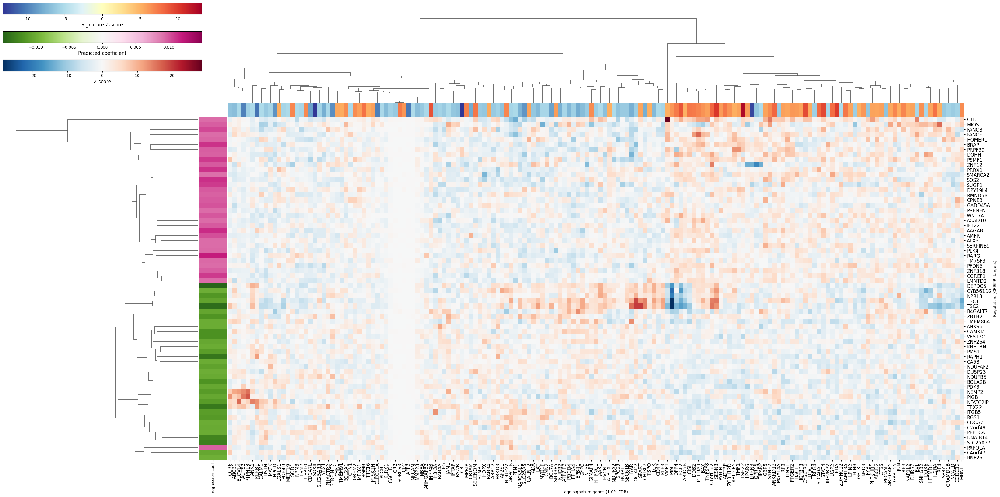

In [423]:
# Create row annotation dataframe with predicted effect sizes (now rows after transpose)
row_annot = pd.DataFrame({
    'regression coef': predicted_effect_size[wide_de_results.index]
})

# Create column annotation dataframe with signature zscores (now columns after transpose)
col_annot = pd.DataFrame({
    'zscore': signature_effect_size.set_index('gene_name').loc[wide_de_results.columns, 'zscore']
})

# Create different color maps for annotations
cmap_row = plt.cm.PiYG_r    # Pink-Yellow-Green for row annotation (predicted effect size)
cmap_col = plt.cm.RdYlBu_r  # Red-Yellow-Blue for column annotation (signature zscore)

# Center the colormaps at 0 by using symmetric vmin/vmax
vmax_row = max(abs(row_annot['regression coef'].min()), abs(row_annot['regression coef'].max()))
vmax_col = max(abs(col_annot['zscore'].min()), abs(col_annot['zscore'].max()))
# Create color series for annotations (seaborn expects Series, not DataFrame with RGBA)
row_colors = row_annot['regression coef'].apply(lambda x: cmap_row((x + vmax_row) / (2 * vmax_row)))
col_colors = col_annot['zscore'].apply(lambda x: cmap_col((x + vmax_col) / (2 * vmax_col)))

# Create the clustermap
plt.figure()
g = sns.clustermap(wide_de_results,
                   cmap='RdBu_r',
                   center=0,
                   vmin=-10,
                   vmax=10,
                   row_cluster=True,
                   col_cluster=True,
                   xticklabels=True,
                   yticklabels=True,
                   method='ward',
                   figsize=(35, 20),
                   row_colors=row_colors,
                   col_colors=[col_colors],
                   cbar_pos=None)

# Adjust layout to make room for additional colorbars
plt.subplots_adjust(top=0.85)

# Add colorbars for annotations - all same width and height
colorbar_width = 0.2
colorbar_height = 0.02
colorbar_left = 0

# Main heatmap colorbar - bottom
cbar_ax_main = g.fig.add_axes([colorbar_left, 0.75, colorbar_width, colorbar_height])
vmax_main = max(abs(wide_de_results.min().min()), abs(wide_de_results.max().max()))
sm_main = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=-vmax_main, vmax=vmax_main))
sm_main.set_array([])
cbar_main = plt.colorbar(sm_main, cax=cbar_ax_main, orientation='horizontal')
cbar_main.set_label('Z-score', fontsize=12)

# Row annotation colorbar (predicted effect size)
cbar_ax_row = g.fig.add_axes([colorbar_left, 0.80, colorbar_width, colorbar_height])
sm_row = plt.cm.ScalarMappable(cmap=cmap_row, norm=plt.Normalize(vmin=-vmax_row, vmax=vmax_row))
sm_row.set_array([])
cbar_row = plt.colorbar(sm_row, cax=cbar_ax_row, orientation='horizontal')
cbar_row.set_label('Predicted coefficient', fontsize=12)

# Column annotation colorbar (signature zscore)
cbar_ax_col = g.fig.add_axes([colorbar_left, 0.85, colorbar_width, colorbar_height])
sm_col = plt.cm.ScalarMappable(cmap=cmap_col, norm=plt.Normalize(vmin=-vmax_col, vmax=vmax_col))
sm_col.set_array([])
cbar_col = plt.colorbar(sm_col, cax=cbar_ax_col, orientation='horizontal')
cbar_col.set_label('Signature Z-score', fontsize=12)

# Rotate x-axis labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', fontsize=12)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=12)

plt.show()

In [360]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

st = 'age'
top_quant = 0.005
alpha = 0.01
c = "Rest"

# Get top DE genes for input signature
train_df = train_results[ct]
train_df['contrast'] = target_state

# Get target state values
state_results_df = train_df
signature_effect_size = state_results_df[(state_results_df['adj_p_value'] < alpha) & 
                                       (abs(state_results_df['zscore']) > 6)].sort_values('zscore')
signature_gs = signature_effect_size.gene_name.tolist()

# Get top and bottom 10% of coefficient values
n = len(p2t_model.get_coefs()['coef_mean'])
st_coefs = p2t_model.get_coefs()
top_10_percent = st_coefs['coef_mean'].nlargest(int(n * top_quant))
predicted_effect_size = top_10_percent.sort_values(ascending=False)
predicted_regulators = predicted_effect_size.index.tolist()

# Get DE results and pivot to wide format
long_de_results = get_DE_results_long(adata_de, targets=predicted_regulators, genes=signature_gs, gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == c].copy()
wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')
wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value')

# Create a mask for diagonal values and low zscore values
mask = pd.DataFrame(False, index=wide_de_results.index, columns=wide_de_results.columns)
for idx in wide_de_results.index:
    if idx in wide_de_results.columns:
        mask.loc[idx, idx] = True
# Add mask for abs zscore < 1
mask = mask | (wide_de_results.abs() < 0)
wide_de_results = wide_de_results.mask(mask, 0)
wide_de_results = wide_de_results.T

# Define axis labels
wide_de_results.index.name = 'Regulators (CRISPRi targets)'
wide_de_results.columns.name = f'{st} signature genes ({alpha*100}% FDR)'
wide_de_results = wide_de_results.dropna(axis=1)


<Figure size 640x480 with 0 Axes>

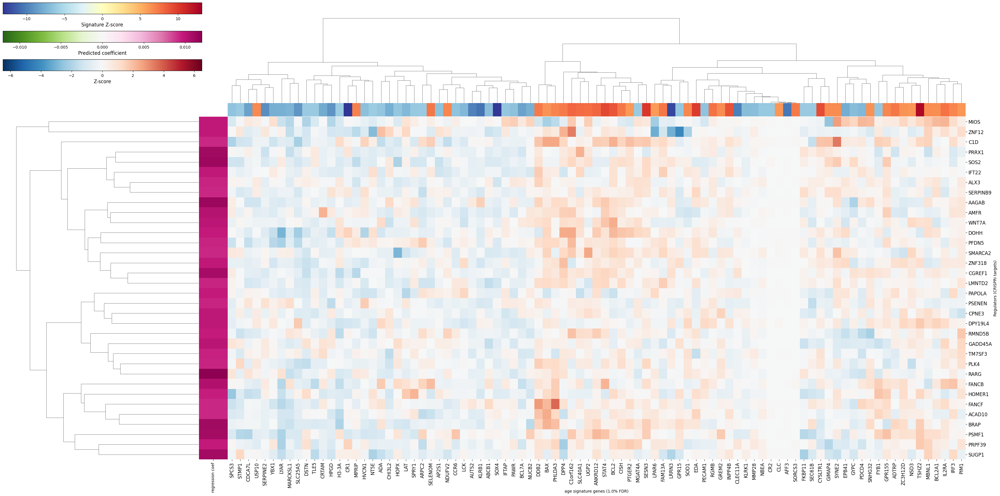

In [361]:
# Create row annotation dataframe with predicted effect sizes (now rows after transpose)
row_annot = pd.DataFrame({
    'regression coef': predicted_effect_size[wide_de_results.index]
})

# Create column annotation dataframe with signature zscores (now columns after transpose)
col_annot = pd.DataFrame({
    'zscore': signature_effect_size.set_index('gene_name').loc[wide_de_results.columns, 'zscore']
})

# Create different color maps for annotations
cmap_row = plt.cm.PiYG_r    # Pink-Yellow-Green for row annotation (predicted effect size)
cmap_col = plt.cm.RdYlBu_r  # Red-Yellow-Blue for column annotation (signature zscore)

# Center the colormaps at 0 by using symmetric vmin/vmax
vmax_row = max(abs(row_annot['regression coef'].min()), abs(row_annot['regression coef'].max()))
vmax_col = max(abs(col_annot['zscore'].min()), abs(col_annot['zscore'].max()))
# Create color series for annotations (seaborn expects Series, not DataFrame with RGBA)
row_colors = row_annot['regression coef'].apply(lambda x: cmap_row((x + vmax_row) / (2 * vmax_row)))
col_colors = col_annot['zscore'].apply(lambda x: cmap_col((x + vmax_col) / (2 * vmax_col)))

# Create the clustermap
plt.figure()
g = sns.clustermap(wide_de_results,
                   cmap='RdBu_r',
                   center=0,
                   vmin=-10,
                   vmax=10,
                   row_cluster=True,
                   col_cluster=True,
                   xticklabels=True,
                   yticklabels=True,
                   method='ward',
                   figsize=(35, 20),
                   row_colors=row_colors,
                   col_colors=[col_colors],
                   cbar_pos=None)

# Adjust layout to make room for additional colorbars
plt.subplots_adjust(top=0.85)

# Add colorbars for annotations - all same width and height
colorbar_width = 0.2
colorbar_height = 0.02
colorbar_left = 0

# Main heatmap colorbar - bottom
cbar_ax_main = g.fig.add_axes([colorbar_left, 0.75, colorbar_width, colorbar_height])
vmax_main = max(abs(wide_de_results.min().min()), abs(wide_de_results.max().max()))
sm_main = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=-vmax_main, vmax=vmax_main))
sm_main.set_array([])
cbar_main = plt.colorbar(sm_main, cax=cbar_ax_main, orientation='horizontal')
cbar_main.set_label('Z-score', fontsize=12)

# Row annotation colorbar (predicted effect size)
cbar_ax_row = g.fig.add_axes([colorbar_left, 0.80, colorbar_width, colorbar_height])
sm_row = plt.cm.ScalarMappable(cmap=cmap_row, norm=plt.Normalize(vmin=-vmax_row, vmax=vmax_row))
sm_row.set_array([])
cbar_row = plt.colorbar(sm_row, cax=cbar_ax_row, orientation='horizontal')
cbar_row.set_label('Predicted coefficient', fontsize=12)

# Column annotation colorbar (signature zscore)
cbar_ax_col = g.fig.add_axes([colorbar_left, 0.85, colorbar_width, colorbar_height])
sm_col = plt.cm.ScalarMappable(cmap=cmap_col, norm=plt.Normalize(vmin=-vmax_col, vmax=vmax_col))
sm_col.set_array([])
cbar_col = plt.colorbar(sm_col, cax=cbar_ax_col, orientation='horizontal')
cbar_col.set_label('Signature Z-score', fontsize=12)

# Rotate x-axis labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', fontsize=12)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=12)

plt.show()

<Axes: xlabel='zscore', ylabel='target_contrast_gene_name'>

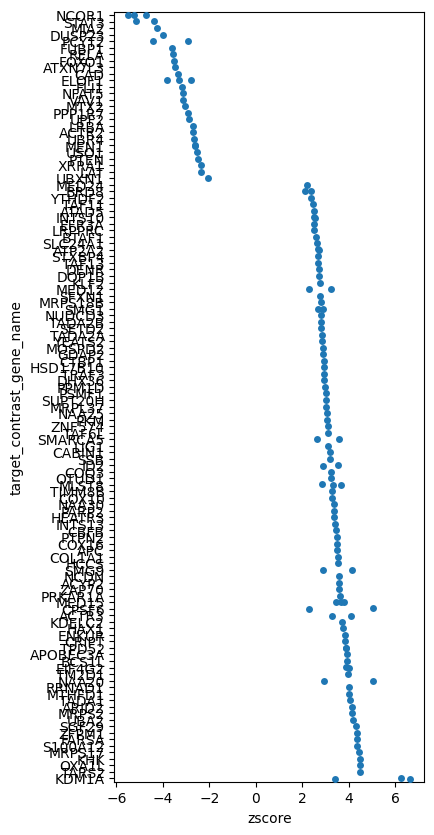

In [382]:
marker_regs = get_DE_results_long(adata_de, genes=['TSHZ2'], gene_id_col='gene_name')
# Calculate mean effect size per target gene
mean_effects = marker_regs[marker_regs['adj_p_value'] < 0.1].groupby('target_contrast_gene_name')['zscore'].mean()
mean_effects = mean_effects.dropna().sort_values()
# Plot with sorted targets
plt.figure(figsize=(4,10))
sns.stripplot(data=marker_regs[marker_regs['adj_p_value'] < 0.1], x='zscore', y='target_contrast_gene_name', 
                order=mean_effects.index)

In [387]:
coefs = p2t_model.get_coefs()

,coef_mean,coef_sem
ABHD5,0.002875,0.000440
TRIO,0.003338,0.000265
CDON,-0.001170,0.000427
COL16A1,-0.007681,0.000461
LRP5L,0.003284,0.000355
...,...,...
MUC1,0.000060,0.000333
CHM,0.002218,0.000371
SERF1B,0.004961,0.000452
NPTXR,-0.001056,0.000420


<Axes: xlabel='reg', ylabel='coef_mean'>

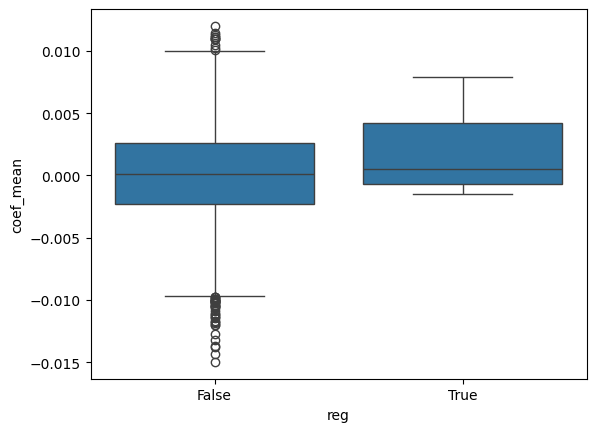

In [399]:
marker_regs = get_DE_results_long(adata_de, genes=['SOX4'], gene_id_col='gene_name')
regs = marker_regs[(marker_regs['adj_p_value'] < 0.1) & (marker_regs['log_fc'] < 0)].target_contrast_gene_name.unique().tolist()

coefs['reg'] = coefs.index.isin(regs)
sns.boxplot(data=coefs, x='reg', y='coef_mean')

<Axes: xlabel='reg', ylabel='coef_mean'>

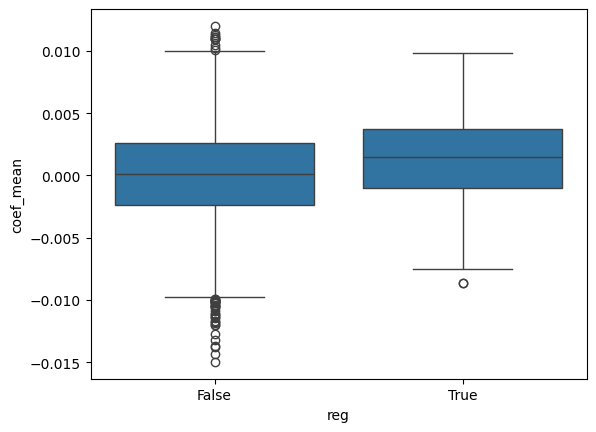

In [413]:
marker_regs = get_DE_results_long(adata_de, genes=['LRRN3'], gene_id_col='gene_name')
regs = marker_regs[(marker_regs['adj_p_value'] < 0.1)].target_contrast_gene_name.unique().tolist()

coefs['reg'] = coefs.index.isin(regs)
sns.boxplot(data=coefs, x='reg', y='coef_mean')

In [425]:
marker_regs[(marker_regs['adj_p_value'] < 0.1)].sort_values('zscore')

,index,gene,log_fc,zscore,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
10365,ENSG00000143437_Rest,LRRN3,-2.009712,-15.847252,7.683189e-53,True,LRRN3,Rest,ENSG00000143437,ARNT
10366,ENSG00000143437_Stim48hr,LRRN3,-2.029852,-13.714003,4.582227e-40,True,LRRN3,Stim48hr,ENSG00000143437,ARNT
10367,ENSG00000143437_Stim8hr,LRRN3,-1.739756,-13.354435,2.986753e-37,True,LRRN3,Stim8hr,ENSG00000143437,ARNT
4339,ENSG00000106546_Rest,LRRN3,-1.608597,-12.214520,3.971414e-31,True,LRRN3,Rest,ENSG00000106546,AHR
4340,ENSG00000106546_Stim48hr,LRRN3,-1.582502,-11.330286,1.810319e-26,True,LRRN3,Stim48hr,ENSG00000106546,AHR
...,...,...,...,...,...,...,...,...,...,...
11302,ENSG00000150776_Rest,LRRN3,0.737180,6.110545,3.390501e-07,True,LRRN3,Rest,ENSG00000150776,NKAPD1
3670,ENSG00000103275_Stim8hr,LRRN3,0.942399,6.156520,7.145232e-07,True,LRRN3,Stim8hr,ENSG00000103275,UBE2I
14203,ENSG00000167286_Stim8hr,LRRN3,0.979023,6.374251,1.740058e-09,True,LRRN3,Stim8hr,ENSG00000167286,CD3D
15847,ENSG00000174437_Stim8hr,LRRN3,0.865469,7.087569,5.661601e-11,True,LRRN3,Stim8hr,ENSG00000174437,ATP2A2


In [414]:
coefs.sort_values('coef_mean', ascending=False)[0:50]

,coef_mean,coef_sem,reg
RARG,0.012014,0.000529,False
AAGAB,0.011428,0.000433,False
SOS2,0.011315,0.000375,False
BRAP,0.011149,0.000311,False
PRRX1,0.011126,0.000558,False
PSMF1,0.010983,0.000382,False
SUGP1,0.010983,0.000575,False
CGREF1,0.010972,0.000451,False
FANCB,0.010474,0.000342,False
AMFR,0.010237,0.000350,False


---

In [41]:
onek1k_path = '/mnt/oak/users/lillian/data/Yazar2022_full_processed.h5ad'
onek1k_ct_counts = pd.read_csv('/mnt/oak/users/lillian/data/cell_type_counts_full.csv', index_col=0)
pct_lymphocytes = calculate_B_T_pct(onek1k_ct_counts)

In [3]:
h5ad_file = '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'
adata_1k1k = anndata.read_h5ad(h5ad_file, backed=True)

In [13]:
adata_1k1k

AnnData object with n_obs × n_vars = 1248980 × 36571 backed at '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'donor_id', 'pool_number', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'age', 'organism_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'cell_type_ontology_term_id_colors', 'default_embedding', 'schema_version', 'title', 'orig.ident_colors', 'predicted.celltype.l2_colors'
 

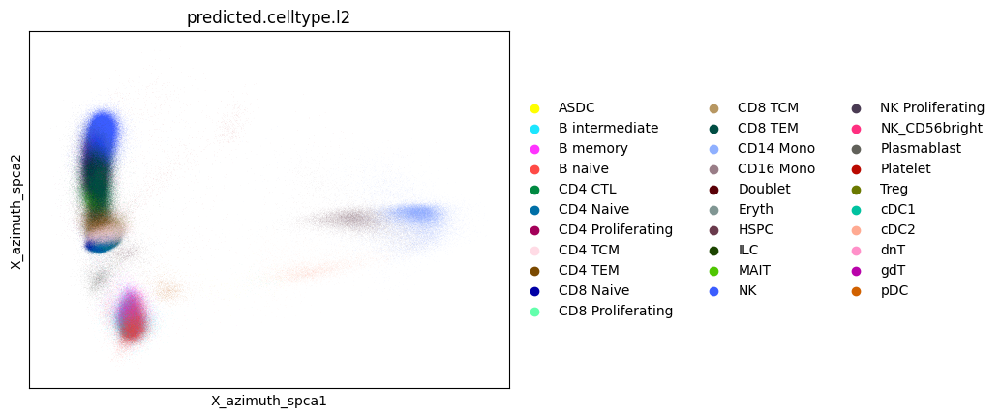

In [16]:
sc.pl.embedding(adata_1k1k, 'X_azimuth_spca', color='predicted.celltype.l2')

In [ ]:
adata_1k1k = anndata.experimental.read_lazy(onek1k_path)
adata = anndata.AnnData(
        obs=adata_1k1k.obs.to_dataframe(),
        var=adata_1k1k.var.to_dataframe()
    )
# adata.layers['counts'] = adata_1k1k.layers['counts']
adata.X = adata_1k1k.layers['counts']
adata

AnnData object with n_obs × n_vars = 526798 × 36571
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'donor_id', 'pool_number', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'age', 'organism_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.v

### Feature selection

In [53]:
# adata = adata[:, (adata.var['n_cells_by_counts'] > 0)].copy()
# # adata = adata[:, (adata.var['n_cells_by_counts'] > 10) & (adata.var['n_cells_by_counts'] < 500000)].copy()
# # adata = adata[:, (adata.var['n_cells_by_counts'] < 500000)].copy()

# adata.var['highly_variable'] = adata.var_names.isin(adata.var['dispersions_norm'].nlargest(10000).index)

# # get features used on perturb-seq dataset
adata_de_var = sc.read_h5ad(f'/mnt/oak/users/emma/data/GWT/CD4i_final//DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad').var
#  adata = adata[:, adata.var_names.isin(adata_de_var['gene_ids'])].copy()

In [1410]:
adata = adata[adata.obs['predicted.celltype.l2'] == 'CD4 TCM'].copy()

In [1411]:
# adata = adata[:, adata.var['highly_variable']].to_memory()
adata = adata.to_memory()

In [2]:
import os
os.listdir()

['compare.py',
 '1k1k_analysis.py',
 '1k1k_highly_variable_5000_genes.csv',
 'pbulked.h5ad',
 'results',
 'process.py',
 'plot.py',
 '1k1k_DE_analysis.ipynb']

In [497]:
# sc.pl.highly_variable_genes(adata)

## Pseudobulk

In [1413]:
pbulk_cols = ['donor_id']
n_cells = adata.obs.groupby(pbulk_cols).size().reset_index().rename({0:'n_cells'}, axis=1)

# Get total cells per donor and filter for >100 cells
donor_total_cells = n_cells.groupby('donor_id')['n_cells'].sum()
# Filter donors between 10th and 90th percentiles of total cells
lower_quantile = donor_total_cells.quantile(0.1)
upper_quantile = donor_total_cells.quantile(0.99)
valid_donors = donor_total_cells[(donor_total_cells >= lower_quantile) & (donor_total_cells <= upper_quantile)].index

# Filter adata for valid donors before aggregating
adata_filtered = adata[adata.obs['donor_id'].isin(valid_donors)].copy()

donor_metadata_cols = ['donor_id', 'pool_number', 'age', 'sex']
donor_metadata = adata_filtered.obs[donor_metadata_cols].drop_duplicates().set_index('donor_id')
donor_metadata['age_cat'] = donor_metadata["age"].apply(categorize_age)
pbulk_adata = sc.get.aggregate(adata_filtered, by=pbulk_cols, func=['sum'])

pbulk_adata.X = pbulk_adata.layers['sum'].copy()
# Add lymphocyte percentages and donor metadata
pbulk_adata.obs = pd.merge(pbulk_adata.obs, pct_lymphocytes, how='left')
pbulk_adata.obs = pd.merge(pbulk_adata.obs, donor_metadata.reset_index(), on='donor_id', how='left')
pbulk_adata.obs = pd.merge(pbulk_adata.obs, n_cells, how='left')
pbulk_adata.obs['log10_n_cells'] = np.log10(pbulk_adata.obs['n_cells'])
# Calculate total counts per donor
pbulk_adata.obs['total_counts'] = pbulk_adata.X.sum(axis=1)

# pbulk_adata.obs['cell_type'] = pbulk_adata.obs['predicted.celltype.l2']
# pbulk_adata = pbulk_adata[pbulk_adata.obs['cell_type'] != 'CD4 TEM'].copy()

pbulk_adata

/tmp/ipykernel_2345666/539000245.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  n_cells = adata.obs.groupby(pbulk_cols).size().reset_index().rename({0:'n_cells'}, axis=1)
/tmp/ipykernel_2345666/539000245.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  donor_total_cells = n_cells.groupby('donor_id')['n_cells'].sum()


AnnData object with n_obs × n_vars = 876 × 29184
    obs: 'donor_id', 'percent_B_cells', 'percent_T_cells', 'pool_number', 'age', 'sex', 'age_cat', 'n_cells', 'log10_n_cells', 'total_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    layers: 'sum'

In [55]:
pbulk_adata = sc.read_h5ad('pbulked.h5ad')
pbulk_adata.var_names.isin(adata_de_var.index).sum()

3450

In [7]:
plt.figure(figsize=(10,6))
plt.scatter(pbulk_adata.obs['log10_n_cells'], pbulk_adata.obs['total_counts'], alpha=0.5)
plt.xlabel('log10(Number of cells)')
plt.ylabel('Total counts')
plt.title('Total counts vs Number of cells per donor')


KeyError: 'log10_n_cells'

<Figure size 1000x600 with 0 Axes>

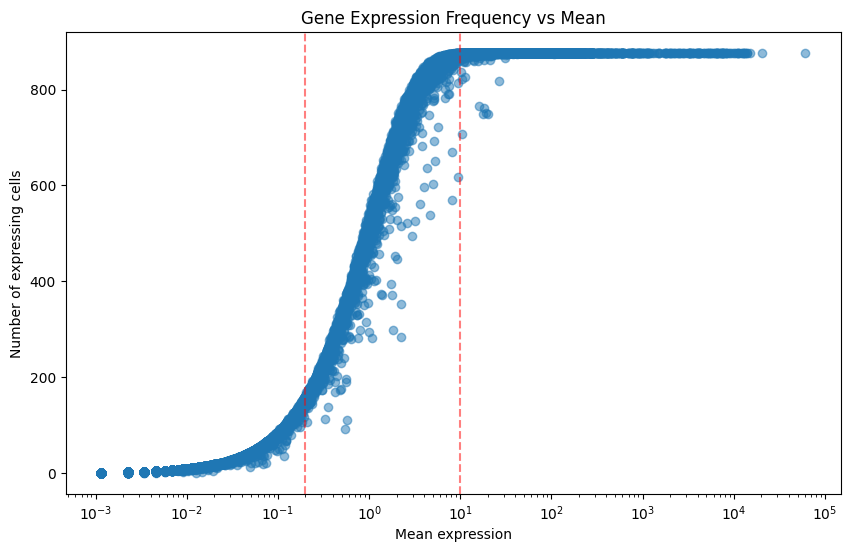

In [1415]:
# Find genes that are expressed in all samples
n_samples = pbulk_adata.n_obs
df = pd.DataFrame({
    'counts': (pbulk_adata.X > 0).sum(axis=0),
    'means': pbulk_adata.X.mean(axis=0)
}, index=pbulk_adata.var_names)

# Plot relationship between mean expression and number of expressing cells
plt.figure(figsize=(10,6))
plt.scatter(df['means'], df['counts'], alpha=0.5)
plt.xlabel('Mean expression')
plt.ylabel('Number of expressing cells')
# plt.yscale("log")
plt.xscale("log")
plt.title('Gene Expression Frequency vs Mean')
plt.axvline(x=0.2, color='r', linestyle='--', alpha=0.5)
plt.axvline(x=10, color='r', linestyle='--', alpha=0.5)

In [1416]:
# Find genes that are expressed in all samples
n_samples = pbulk_adata.n_obs
gene_counts = (pbulk_adata.X > 0).sum(axis=0)
gene_means = pbulk_adata.X.mean(axis=0)
genes_2_keep = pbulk_adata.var_names[(gene_means < 10) & (gene_means > 0.2)]

# Exclude ubiquitously expressed
pbulk_adata = pbulk_adata[:, genes_2_keep].copy()
pbulk_adata

AnnData object with n_obs × n_vars = 876 × 9464
    obs: 'donor_id', 'percent_B_cells', 'percent_T_cells', 'pool_number', 'age', 'sex', 'age_cat', 'n_cells', 'log10_n_cells', 'total_counts'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    layers: 'sum'

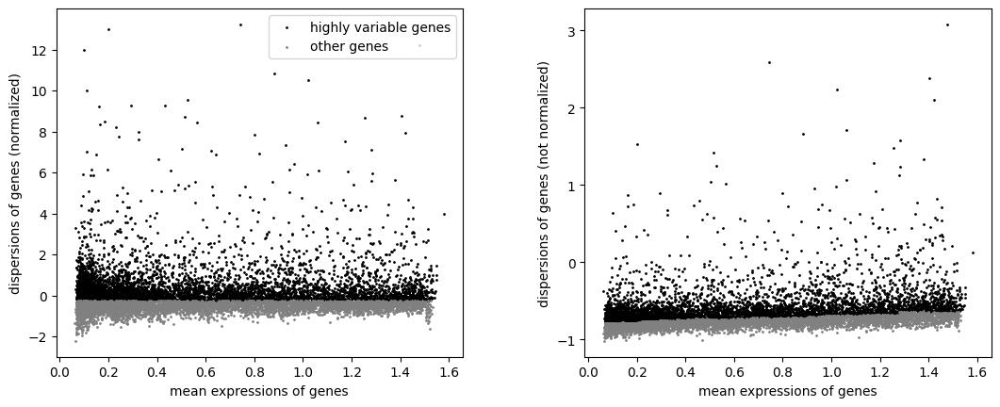

In [1417]:
scales_counts = sc.pp.normalize_total(pbulk_adata, target_sum=10000, inplace=False)
pbulk_adata.X = sc.pp.log1p(scales_counts["X"], copy=True)
sc.pp.highly_variable_genes(pbulk_adata, n_top_genes=5000)
sc.pl.highly_variable_genes(pbulk_adata)
pbulk_adata.X = pbulk_adata.layers['sum']

# n_samples = pbulk_adata.n_obs
# df = pd.DataFrame({
#     'counts': (pbulk_adata.X > 0).sum(axis=0),
#     'means': pbulk_adata.X.mean(axis=0)
# }, index=pbulk_adata.var_names)

# # Plot relationship between mean expression and number of expressing cells
# plt.figure(figsize=(10,6))
# plt.scatter(df['means'], df['counts'], alpha=0.5)
# plt.xlabel('Mean expression')
# plt.ylabel('Number of expressing cells')
# # plt.yscale("log")
# plt.xscale("log")
# plt.title('Gene Expression Frequency vs Mean')
# plt.axvline(x=0.1, color='r', linestyle='--', alpha=0.5)
# plt.axvline(x=11, color='r', linestyle='--', alpha=0.5)

In [1418]:
# pbulk_adata_pca = pbulk_adata[pbulk_adata.obs['predicted.celltype.l2'] == 'CD4 Naive'].copy()
pbulk_adata_pca = pbulk_adata.copy()
pbulk_adata_pca.obs_names = pbulk_adata_pca.obs['donor_id'].values
scales_counts = sc.pp.normalize_total(pbulk_adata_pca, target_sum=None, inplace=False)
pbulk_adata_pca.X = sc.pp.log1p(scales_counts["X"], copy=True)
sc.pp.pca(pbulk_adata_pca) 

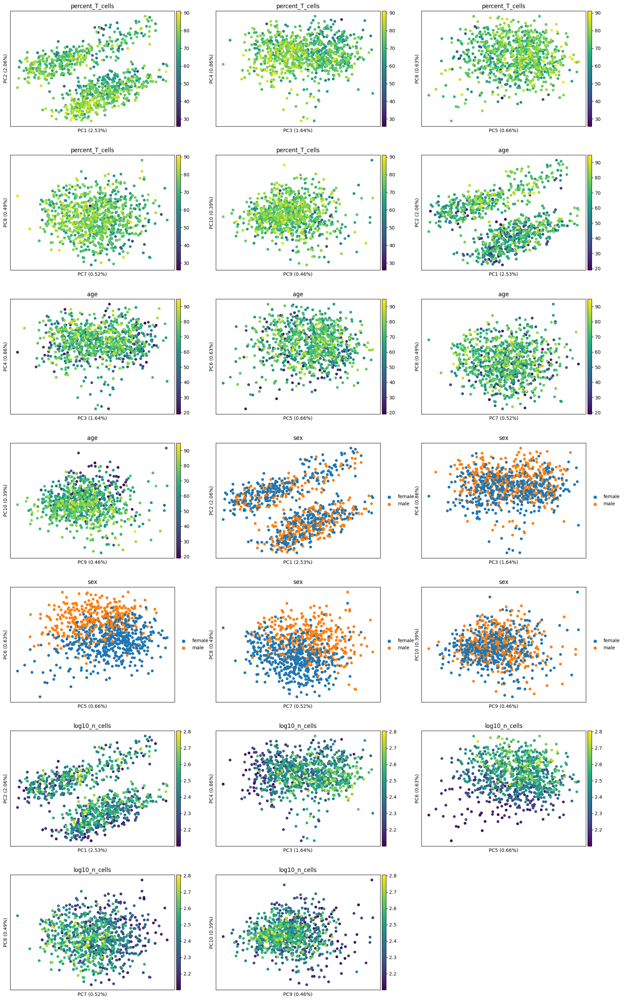

/tmp/ipykernel_2345666/391751638.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pool_means = df.groupby('pool_number')['PC1'].mean().sort_values()


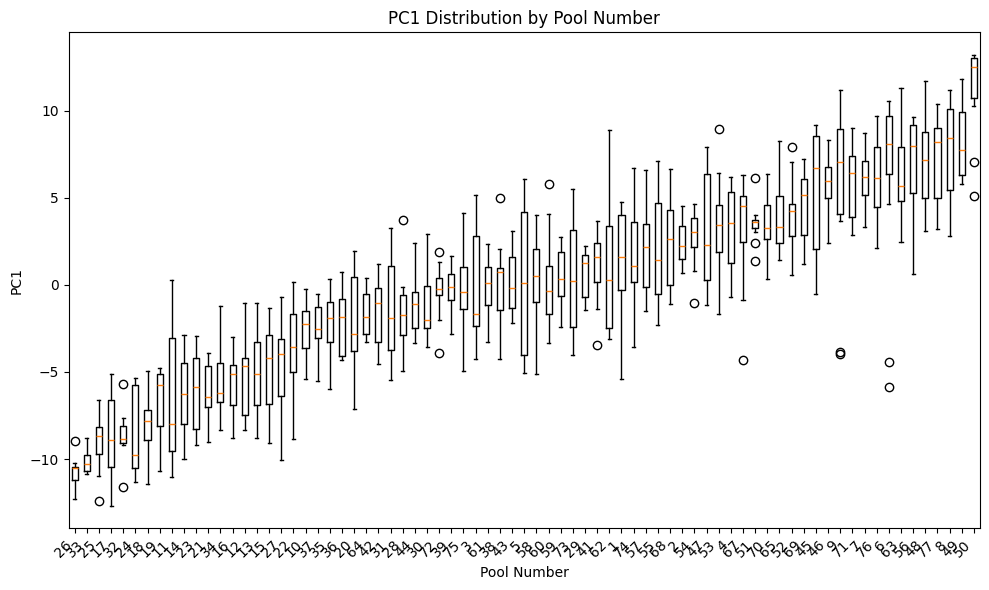

In [1419]:
sc.pl.pca(pbulk_adata_pca, color=['percent_T_cells', 'age', 'sex', 'log10_n_cells'], components=['1,2', '3,4', '5,6', '7,8', '9,10'], ncols=3, annotate_var_explained=True)

# Plot PC1 vs pool
df = pd.DataFrame({
    'pool_number': pbulk_adata_pca.obs['pool_number'],
    'PC1': pbulk_adata_pca.obsm['X_pca'][:,0]
})

pool_means = df.groupby('pool_number')['PC1'].mean().sort_values()
sorted_pools = pool_means.index

plt.figure(figsize=(10,6))
plt.boxplot([df[df['pool_number']==pool]['PC1'] for pool in sorted_pools], 
            labels=sorted_pools)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Pool Number')
plt.ylabel('PC1')
plt.title('PC1 Distribution by Pool Number')
plt.tight_layout()

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.13', 'LINC01409', 'LINC01128', 'LINC00115', 'FAM41C']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


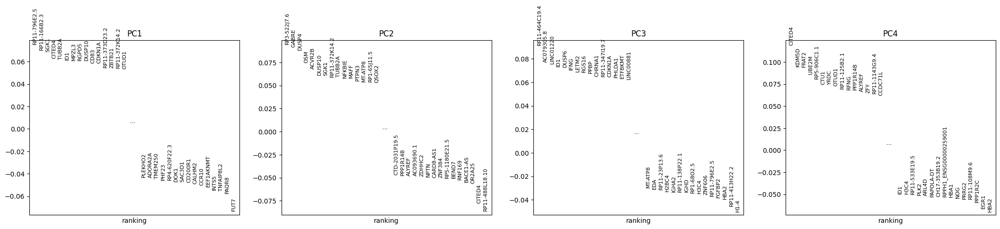

In [1420]:
pbulk_adata_pca.var_names = pbulk_adata_pca.var['feature_name'].copy()
sc.pl.pca_loadings(pbulk_adata_pca,[1,2,3,4])

In [1421]:
top_pcs = sc.get.obs_df(pbulk_adata_pca, obsm_keys=[('X_pca', i) for i in range(20)]).reset_index()
top_pcs.columns = ['donor_id'] + [f'donor_PC{i+1}' for i in range(20)]

In [1422]:
pbulk_adata.obs = pd.merge(pbulk_adata.obs, top_pcs)


In [1423]:
pbulk_adata

AnnData object with n_obs × n_vars = 876 × 9464
    obs: 'donor_id', 'percent_B_cells', 'percent_T_cells', 'pool_number', 'age', 'sex', 'age_cat', 'n_cells', 'log10_n_cells', 'total_counts', 'donor_PC1', 'donor_PC2', 'donor_PC3', 'donor_PC4', 'donor_PC5', 'donor_PC6', 'donor_PC7', 'donor_PC8', 'donor_PC9', 'donor_PC10', 'donor_PC11', 'donor_PC12', 'donor_PC13', 'donor_PC14', 'donor_PC15', 'donor_PC16', 'donor_PC17', 'donor_PC18', 'donor_PC19', 'donor_PC20'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'sum'

## DE test


In [18]:
metadata = pbulk_adata.obs.copy()
metadata = metadata.loc[:,~metadata.columns.str.startswith('pool')]
covars = list(metadata.columns.drop(['age','donor_id','predicted.celltype.l2','total_counts','cell_counts','avg_count_per_cell','log_counts_per_cell']))
covars

['male',
 'CD4_Naive',
 'CD4_TCM',
 'age_cat',
 'percent_B_cells',
 'percent_T_cells']

In [ ]:
pbulk_adata.var_names = pbulk_adata.var['feature_name']

,feature_name,_normed_means,non_zero,_MoM_dispersions,genewise_dispersions,_genewise_converged,fitted_dispersions,MAP_dispersions,_MAP_converged,dispersions,_outlier_genes,_LFC_converged,replaced,refitted,_pvalue_cooks_outlier
ensembl_id,,,,,,,,,,,,,,,
ENSG00000241180,RP11-54O7.2,0.000105,True,1.000000e-08,1.000000e-08,True,19523.742396,2943.000000,True,2943.000000,False,True,False,False,False
ENSG00000187608,ISG15,24.951201,True,1.800509e-01,1.020393e-01,True,0.133332,0.102059,True,0.102059,False,True,False,False,False
ENSG00000285812,RP11-465B22.9,0.019745,True,1.000000e-08,1.000000e-08,True,103.664228,61.729636,True,61.729636,False,True,False,False,False
ENSG00000223823,LINC01342,0.001069,True,1.000000e-08,1.000000e-08,True,1914.474616,1915.557906,True,1915.557906,False,True,False,False,False
ENSG00000186827,TNFRSF4,7.660033,True,4.148061e-01,1.005419e-01,True,0.318420,0.100734,True,0.100734,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000169807,PRY2,0.000189,True,1.000000e-08,1.000000e-08,True,10838.013842,2943.000000,True,2943.000000,False,True,False,False,False
ENSG00000228786,LINC00266-4P,0.002916,True,1.000000e-08,1.000000e-08,True,701.662185,818.512364,True,818.512364,False,True,False,False,False
ENSG00000198763,MT-ND2,1037.818202,True,5.548903e-02,4.510269e-02,True,0.053308,0.045106,True,0.045106,False,True,False,False,False


In [20]:
onek1k_design = f"~ male + age_cat + percent_B_cells + percent_T_cells + CD4_TCM + CD4_Naive"
print(onek1k_design)
# pbulk_adata.X = pbulk_adata.layers['sum'].copy()
# pbulk_adata.var = pbulk_adata.var.reset_index()
# pbulk_adata.var.index = pbulk_adata.var['feature_name'].values
model = pertpy.tl.PyDESeq2(pbulk_adata, design=onek1k_design)
model.fit(quiet=True)

~ male + age_cat + percent_B_cells + percent_T_cells + CD4_TCM + CD4_Naive


[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done 717 tasks      | elapsed:    2.9s
[Parallel(n_jobs=64)]: Done 2382 tasks      | elapsed:    3.3s
[Parallel(n_jobs=64)]: Done 5000 out of 5000 | elapsed:    3.8s finished
[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done 632 tasks      | elapsed:    0.2s
[Parallel(n_jobs=64)]: Done 2382 tasks      | elapsed:    0.4s
[Parallel(n_jobs=64)]: Done 5000 out of 5000 | elapsed:    0.8s finished
[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done 632 tasks      | elapsed:    0.2s
[Parallel(n_jobs=64)]: Done 2382 tasks      | elapsed:    0.5s
[Parallel(n_jobs=64)]: Done 5000 out of 5000 | elapsed:    0.9s finished
[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done 632 tasks      | elapsed:    0.2s
[Parallel(n_jobs=64)]: Done 2382 tas

In [24]:
covar = 'male'

contrast = np.zeros(len(model.dds.obsm['design_matrix'].columns), dtype=int)
contrast[np.where(model.dds.obsm['design_matrix'].columns == covar)[0][0]] = 1
res_df = model.test_contrasts(contrast)

Running Wald tests...


Log2 fold change & Wald test p-value, contrast vector: [0 1 0 0 0 0 0]
                    baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ensembl_id                                                                   
ENSG00000241180     0.000105        0.207943  2.991035  0.069522  0.944574   
ENSG00000187608    24.951201       -0.044697  0.021528 -2.076198  0.037876   
ENSG00000285812     0.019745        0.213657  0.453790  0.470828  0.637764   
ENSG00000223823     0.001069        0.206931  2.414673  0.085697  0.931707   
ENSG00000186827     7.660033        0.068784  0.027988  2.457607  0.013987   
...                      ...             ...       ...       ...       ...   
ENSG00000169807     0.000189        0.208356  2.991034  0.069660  0.944464   
ENSG00000228786     0.002916        0.194648  1.582329  0.123014  0.902096   
ENSG00000198763  1037.818202       -0.038283  0.011981 -3.195438  0.001396   
ENSG00000198804  1377.589436        0.037570  0.008574  4.381733  0.000

... done in 0.68 seconds.



In [56]:
res_df = pd.read_csv('results/DE_age_cat.csv')
res_df = res_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
res_df

,variable,baseMean,log_fc,lfcSE,stat,pvalue,adj_p_value
0,ENSG00000241180,0.000105,0.008661,1.346779,0.006431,0.994869,NaN
1,ENSG00000187608,24.951201,-0.013711,0.009435,-1.453144,0.146184,0.462435
2,ENSG00000285812,0.019745,0.007370,0.208147,0.035409,0.971753,NaN
3,ENSG00000223823,0.001069,0.005589,1.346768,0.004150,0.996689,NaN
4,ENSG00000186827,7.660033,-0.014927,0.012010,-1.242814,0.213936,0.587697
...,...,...,...,...,...,...,...
4995,ENSG00000169807,0.000189,0.008843,1.346779,0.006566,0.994761,NaN
4996,ENSG00000228786,0.002916,0.009977,0.802468,0.012432,0.990081,NaN
4997,ENSG00000198763,1037.818202,0.016702,0.005199,3.212401,0.001316,0.011921
4998,ENSG00000198804,1377.589436,-0.008438,0.003556,-2.372830,0.017652,0.095766


In [1424]:
onek1k_design = f"~ log10_n_cells + percent_T_cells + {' + '.join([f'donor_PC{i}' for i in range(1,10)])} + age_cat + sex"
print(onek1k_design)
pbulk_adata.X = pbulk_adata.layers['sum'].copy()
pbulk_adata.var = pbulk_adata.var.reset_index()
pbulk_adata.var.index = pbulk_adata.var['feature_name'].values
model = pertpy.tl.PyDESeq2(pbulk_adata, design=onek1k_design)
model.fit(quiet=True)

~ log10_n_cells + percent_T_cells + donor_PC1 + donor_PC2 + donor_PC3 + donor_PC4 + donor_PC5 + donor_PC6 + donor_PC7 + donor_PC8 + donor_PC9 + age_cat + sex


[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done   2 out of   2 | elapsed:   37.7s finished
[Parallel(n_jobs=64)]: Done 5408 tasks      | elapsed:   39.4s
[Parallel(n_jobs=64)]: Done 8579 tasks      | elapsed:   39.7s
[Parallel(n_jobs=64)]: Done 8929 tasks      | elapsed:   40.0s
[Parallel(n_jobs=64)]: Done 9379 tasks      | elapsed:   40.4s
[Parallel(n_jobs=64)]: Done 9464 out of 9464 | elapsed:   40.5s finished
[Parallel(n_jobs=64)]: Using backend LokyBackend with 64 concurrent workers.
[Parallel(n_jobs=64)]: Done 4264 tasks      | elapsed:    0.8s
[Parallel(n_jobs=64)]: Done 7308 tasks      | elapsed:    1.0s
[Parallel(n_jobs=64)]: Done 8928 tasks      | elapsed:    1.2s
[Parallel(n_jobs=64)]: Done 9378 tasks      | elapsed:    1.5s
[Parallel(n_jobs=64)]: Done 9464 out of 9464 | elapsed:    1.5s finished
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/pydeseq2/dds.py:784: FutureWarning: Setting an item o

In [1425]:
# Define tests of interest
all_contrasts = {}

all_contrasts['sex'] = model.cond(sex = 'male') 

age_contrast = all_contrasts['sex'].copy()
age_contrast.loc['sex[T.male]'] = 0
age_contrast.loc['age_cat'] = 1
all_contrasts['age'] = age_contrast

pctT_contrast = age_contrast.copy()
pctT_contrast['age_cat'] = 0
pctT_contrast['percent_T_cells'] = 1
all_contrasts['percent_T_cells'] = pctT_contrast


In [1426]:
res_df = model.test_contrasts(all_contrasts)

Running Wald tests...
... done in 1.03 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value, contrast vector: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
RP11-34P13.13  0.294275       -2.989051  2.683571 -1.113834  0.265351   
LINC01409      5.102803        3.400245  0.817493  4.159359  0.000032   
LINC01128      5.238415        2.833207  0.738288  3.837537  0.000124   
LINC00115      1.186887        1.582587  1.536730  1.029841  0.303085   
FAM41C         3.879874        2.855798  0.845663  3.376993  0.000733   
...                 ...             ...       ...       ...       ...   
TTTY14         0.678147        3.421828  2.054382  1.665624  0.095788   
RP11-424G14.1  0.236208        1.800463  2.916763  0.617281  0.537049   
KDM5D          7.149554        2.471589  0.838404  2.947968  0.003199   
TTTY10         0.530114        3.269428  2.189214  1.493426  0.135326   
MT-ATP8        6.906958        0.765702  0.738163  1.037307  0.299593   

                   padj 

... done in 1.04 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value, contrast vector: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
RP11-34P13.13  0.294275       -2.972103  2.672860 -1.111956  0.266157   
LINC01409      5.102803        3.342056  0.814318  4.104118  0.000041   
LINC01128      5.238415        2.654764  0.736578  3.604186  0.000313   
LINC00115      1.186887        1.288539  1.531340  0.841445  0.400099   
FAM41C         3.879874        3.263351  0.843238  3.870023  0.000109   
...                 ...             ...       ...       ...       ...   
TTTY14         0.678147        1.300795  2.035539  0.639042  0.522795   
RP11-424G14.1  0.236208        0.333263  2.890051  0.115314  0.908196   
KDM5D          7.149554       -0.141259  0.832035 -0.169776  0.865187   
TTTY10         0.530114        1.437538  2.167773  0.663141  0.507241   
MT-ATP8        6.906958        0.920552  0.735188  1.252132  0.210522   

                   padj 

... done in 0.99 seconds.



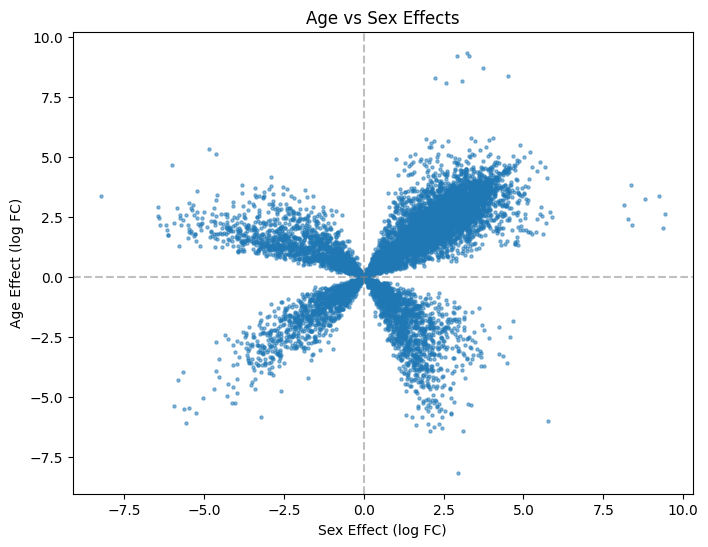

In [1432]:
age_res = res_df[res_df['contrast'] == 'age'].set_index('variable')
sex_res = res_df[res_df['contrast'] == 'percent_T_cells'].set_index('variable')

plt.figure(figsize=(8,6))
plt.scatter(sex_res['log_fc'], age_res['log_fc'], alpha=0.5, s=5)
plt.xlabel('Sex Effect (log FC)')
plt.ylabel('Age Effect (log FC)') 
plt.title('Age vs Sex Effects')
plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.show()

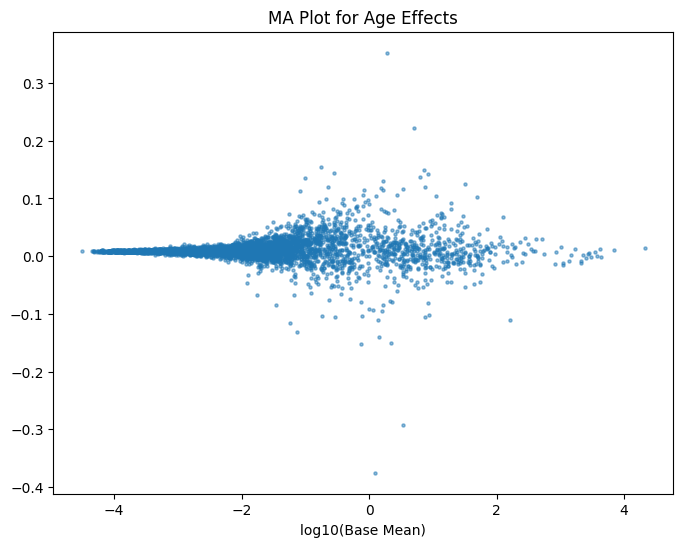

In [57]:
age_res = res_df
# age_res = res_df[res_df['contrast'] == 'male']
# age_res = age_res[age_res['baseMean'] > 1]
plt.figure(figsize=(8,6))
# plt.scatter(np.log10(age_res['baseMean']), -np.log10(age_res['adj_p_value']), alpha=0.5, s=5)
plt.scatter(np.log10(age_res['baseMean']), age_res['log_fc'], alpha=0.5, s=5)
plt.xlabel('log10(Base Mean)')
plt.title('MA Plot for Age Effects')
plt.show()

NaNs encountered, dropping rows with NaNs


<Figure size 1000x3000 with 0 Axes>

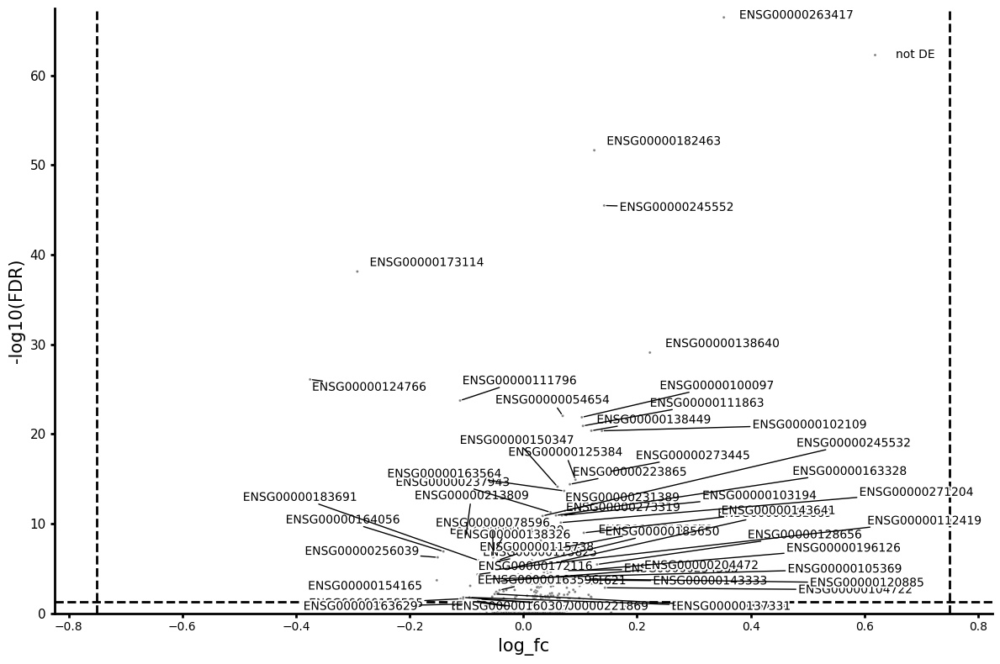

In [58]:
plt.figure(figsize=(10,30))
fig = model.plot_volcano(
    res_df, 
    # log2fc_thresh=4, 
    return_fig=True, 
    to_label = 30,
    # to_label = annotate_gs + top_gs,
    varm_key='ensembl_id',
    figsize=(12, 8),  # Increased figure size
    s=5,
    legend_pos = (0.95,0.95),
    # x_label = f'DE log Fold Change (Th0 vs {p})',
    y_label = '-log10(FDR)'
    )
fig.tight_layout()  # Ensure title is visible
fig.show()  # Explicitly show the figure

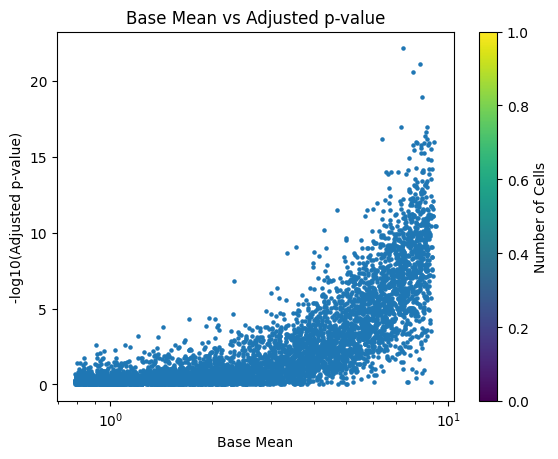

In [1366]:
df = pd.concat([age_res.set_index('variable'), adata.var['n_cells_by_counts']], axis=1)
plt.figure()
plt.scatter(df['baseMean'],-np.log10(df['adj_p_value']),  alpha=1, s=5)
plt.xlabel('Base Mean')
plt.ylabel('-log10(Adjusted p-value)')
plt.title('Base Mean vs Adjusted p-value')
plt.xscale('log')
plt.colorbar(label='Number of Cells')
plt.show()


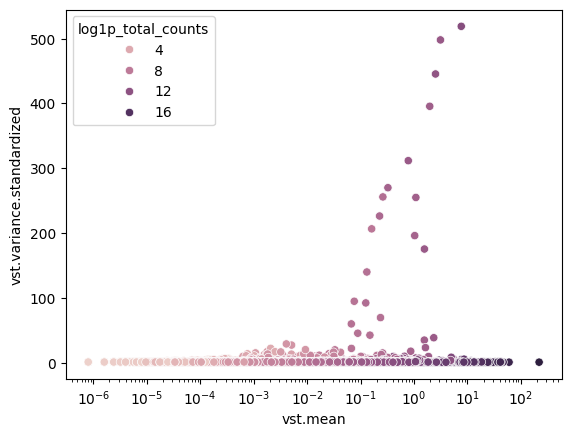

In [1168]:
sns.scatterplot(data=adata.var, x='vst.mean', y='vst.variance.standardized', hue='log1p_total_counts');
plt.xscale('log')

In [8]:
import os
import pandas as pd
grna_df = pd.read_parquet('../../metadata/sgrna_df_final.parquet')
# grna_df = pd.read_csv('../../metadata/sgRNA_library_curated.csv')
grna_df

,sgRNA,chromosome,pos,seq_last19bp,strand,PAM,note,flag,seq,target_gene_name_from_sgRNA,...,nearest_within2kb_gene_dist,nearest_within2kb_nontarget_gene_id,nearest_within2kb_nontarget_gene_name,nearest_within2kb_nontarget_gene_dist,putative_bidirectional_promoter,other_alignment_chromosome,other_alignment_pos,nearest_nontarget_gene_id,nearest_nontarget_gene_name,nearest_nontarget_gene_dist
0,ARMC5-1,chr16,31459566,TGCCTCGCGCAGCTCGCGG,+,True,"unique alignment, aligned to a cds but far fro...",True,CTGCCTCGCGCAGCTCGCGG,ARMC5,...,65.0,None,None,NaN,False,None,None,ENSG00000140682,TGFB1I1,12019.0
1,DDB1-1,chr11,61333047,GAGTTCGCTGCGCGCTGTT,-,True,"unique alignment, aligned to a cds but far fro...",True,GGAGTTCGCTGCGCGCTGTT,DDB1,...,6.0,ENSG00000149476,TKFC,174.0,True,None,None,ENSG00000149476,TKFC,174.0
2,FNDC10-1,chr1,1600078,GCCCGCTCCCCGCGATCCC,+,True,"unique alignment, aligned to a cds but far fro...",True,TGCCCGCTCCCCGCGATCCC,FNDC10,...,57.0,None,None,NaN,False,None,None,ENSG00000197530,MIB2,15422.0
3,RORC-1,chr1,151831746,CTGTGGGGCCCTGTCCATG,+,True,"unique alignment, aligned to a cds but far fro...",True,TCTGTGGGGCCCTGTCCATG,RORC,...,56.0,None,None,NaN,False,None,None,ENSG00000225556,C2CD4D,8074.0
4,SLC35F6-1,chr2,26764356,AACAGCTGGTACTTGGTCC,-,True,"unique alignment, aligned to a cds but far fro...",True,GAACAGCTGGTACTTGGTCC,SLC35F6,...,66.0,ENSG00000115163,CENPA,67.0,False,None,None,ENSG00000115163,CENPA,67.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25507,TYW1B-1,chr7,72744713,GCGTCGTGCAGATACTAGT,-,True,"hg17 alignment, AtoG at pos6, aligned to a cds...",True,GGCGTCGTGCAGATACTAGT,TYW1B,...,NaN,None,None,NaN,False,None,None,ENSG00000196313,POM121,134636.0
25508,NBPF14-1,chr1,120451417,AATATTTATCAAACAGAGG,+,True,"hg17 alignment, AtoG at pos19, multi alignment...",True,GAATATTTATCAAACAGAGG,NBPF14,...,NaN,None,None,NaN,False,"[chr1, chr1]","[120807845, 120814130]",ENSG00000273136,NBPF26,239.0
25509,MUC12-2,chr7,100969567,TCTTGGTCCCTCCTGACGA,+,False,"unique alignment, target gene mismatch, aligne...",True,GTCTTGGTCCCTCCTGACGA,MUC12,...,2.0,None,None,NaN,False,None,None,ENSG00000169894,MUC3A,19942.0
25510,SRGAP2-2,chr1,206463364,CACAGGTCCCGAGCCAACG,+,True,"hg17 alignment, AtoG at pos11, within target g...",True,GCACAGGTCCCGAGCCAACG,SRGAP2,...,NaN,None,None,NaN,False,None,None,ENSG00000263528,IKBKE,7112.0


In [14]:
grna_df[grna_df['sgRNA'] == 'NTC-001']

,sgRNA,chromosome,pos,seq_last19bp,strand,PAM,note,flag,seq,target_gene_name_from_sgRNA,...,nearest_within2kb_gene_dist,nearest_within2kb_nontarget_gene_id,nearest_within2kb_nontarget_gene_name,nearest_within2kb_nontarget_gene_dist,putative_bidirectional_promoter,other_alignment_chromosome,other_alignment_pos,nearest_nontarget_gene_id,nearest_nontarget_gene_name,nearest_nontarget_gene_dist
